This notebook contains all code used to make my thesis plots.

In [1]:
from copy import deepcopy
from contextlib import contextmanager

import pandas as pd
import numpy as np
import matplotlib as mpl
from matplotlib.pyplot import cm
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from itertools import izip
from matplotlib.ticker import ScalarFormatter, FormatStrFormatter, MultipleLocator
from collections import namedtuple
from IPython.display import IFrame
import functools

%matplotlib inline

get_ipython().magic(u'load_ext autoreload')
get_ipython().magic(u'autoreload 2')


mpl.rcParams['font.size'] = 18
mpl.rcParams['figure.figsize'] = (7.0, 4.0)  # default size of plots
mpl.rcParams['axes.labelsize'] = 22
mpl.rcParams['xtick.labelsize'] = 16
mpl.rcParams['ytick.labelsize'] = 16
mpl.rcParams['xtick.major.size'] = 10
mpl.rcParams['ytick.major.size'] = 10
mpl.rcParams['xtick.minor.size'] = 5
mpl.rcParams['ytick.minor.size'] = 5
mpl.rcParams['legend.framealpha'] = 0.6
mpl.rcParams['legend.scatterpoints'] = 1
mpl.rcParams['legend.numpoints'] = 1
# mpl.rcParams.update({'font.size': 24, 'font.family': 'STIXGeneral', 'mathtext.fontset': 'stix'})
mpl.rcParams.update({'font.family': 'STIXGeneral', 'mathtext.fontset': 'stix'})
pd.set_option('display.max_colwidth', 120)
pd.set_option('display.max_columns', 200)
pd.set_option('display.max_rows', 500)

In [2]:
from common_plots import *

In [3]:
# Make subsets based on masses, and passing ALL NMSSMTools constraints (i.e. don't ignore g-2 and relic density)
from make_hdf5 import subset_var

In [4]:
# Here get your dataframes.
# Extract dataframes from binary
store = pd.HDFStore("points_500_MICRO_SCAN_NTv491_HBv431_HSv140_largeRange_DMass2_fixAssignMass_04_Jul_16_1658.h5")
# df_orig = store.full12loop_all
df_pass_all = store.full12loop_good_posMuMagMom_planckUpperOnly_ignorebctaunu_ignorechi2 #'relaxed' constraints - +ve g-2 and omegah^2

store.close()

Helper funcitons for saving plots with different backends easily:

In [5]:
def get_backend():
    return list(get_ipython().magic(u"config InlineBackend.figure_formats"))

def set_backend(fmt):
    print 'Setting backend', fmt
    get_ipython().magic(u"config InlineBackend.figure_formats = '%s', " % fmt)

@contextmanager
def backend(fmt):
    old_fmt = get_backend()[0]
    set_backend(fmt)
    yield
#     set_backend(old_fmt)
    set_backend('png')

def save_fig(func):
    """Decorator func for easily saving plots in jupyter notebook.
    
    Just add in a filename=XXX to your normal function arguments.
    It will auto switch backends correctly.
    """
    def wrapper(*args, **kwargs):
        filename = kwargs['filename']
        if filename == '':
            raise IOError('No filename')
        if '.' not in filename:
            raise IOError('No extension in filename: %s' % filename)
        fmt = os.path.splitext(filename)[1].lstrip('.') if SAVE_PLOTS else 'png'
        with backend(fmt):
            new_kwargs = deepcopy(kwargs)
            del new_kwargs['filename']
            func(*args, **new_kwargs)
            if SAVE_PLOTS: 
                save_plot(filename)
    return wrapper


In [6]:
SAVE_PLOTS = True

if SAVE_PLOTS:
    set_backend('png')
    mpl.rcParams['savefig.dpi'] = 100
else:
    set_backend('png')
    mpl.rcParams['savefig.dpi'] = 72

Setting backend png


In [7]:
for k,v in mpl.rcParams.iteritems():
    if 'legend' in k.lower():
        print k, v

legend.labelspacing 0.5
legend.handletextpad 0.8
legend.framealpha 0.6
legend.isaxes True
legend.fontsize large
legend.scatterpoints 1
legend.shadow False
legend.frameon True
legend.markerscale 1.0
legend.fancybox False
legend.loc upper right
legend.borderpad 0.4
legend.handleheight 0.7
legend.numpoints 1
legend.handlelength 2.0
legend.borderaxespad 0.5
legend.columnspacing 2.0


In [8]:
df_pass_all_ma1 = subset_var(df_pass_all, 3.5, 10.5, 'ma1')

In [9]:
title = 'Relaxed constraints'
SIZE = 15

In [10]:
@save_fig
def plot_ma1_inputparams(df, title):
    plot_input_params_scatters(df, 'ma1', r'$m_{a_1}\ \mathrm{[GeV]}$', 
                               yrange=[0, 20], title=title, cols=2, s=SIZE)

Setting backend png


/Users/robina/.virtualenvs/NMSSMScan/lib/python2.7/site-packages/matplotlib/collections.py:590: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if self._edgecolors == str('face'):


Setting backend png


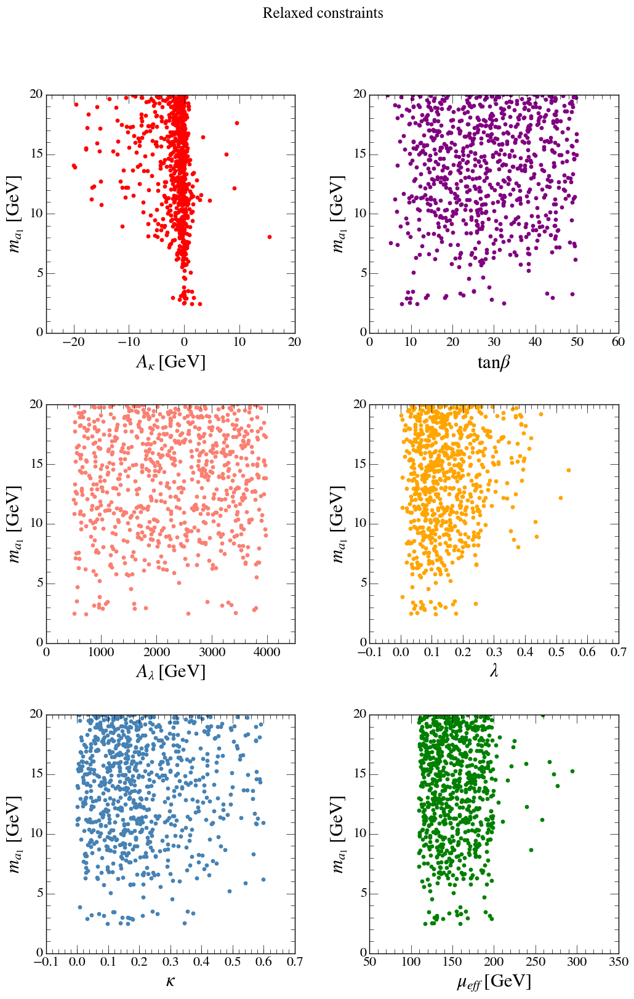

In [11]:
plot_ma1_inputparams(df_pass_all[~df_pass_all.constraints.str.contains('chi2')], 
                     title, filename='Thesis_plots_2_largeTanBeta/ma1_inputparams_relaxed.png')

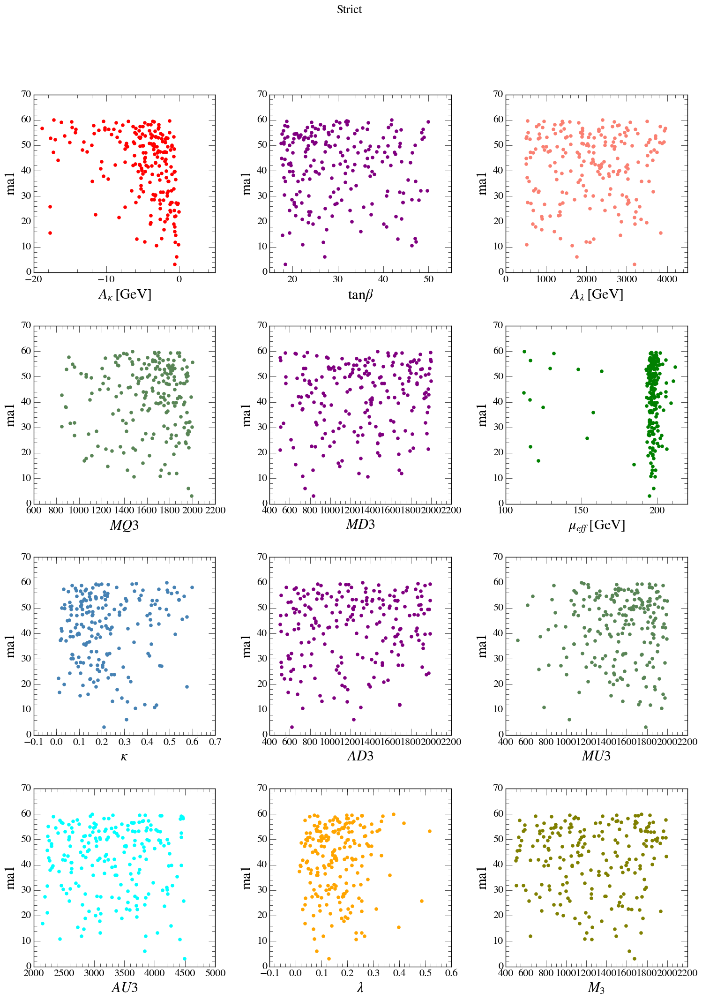

In [14]:
plot_input_params_scatters(df_pass_all[df_pass_all.constraints == 'b -> c tau nu more than 2 sigma away (as SM)'], 
                           ylabel='ma1', title='Strict', yvar='ma1', param_dict=nmssm_params_extended)

Setting backend png
Setting backend png


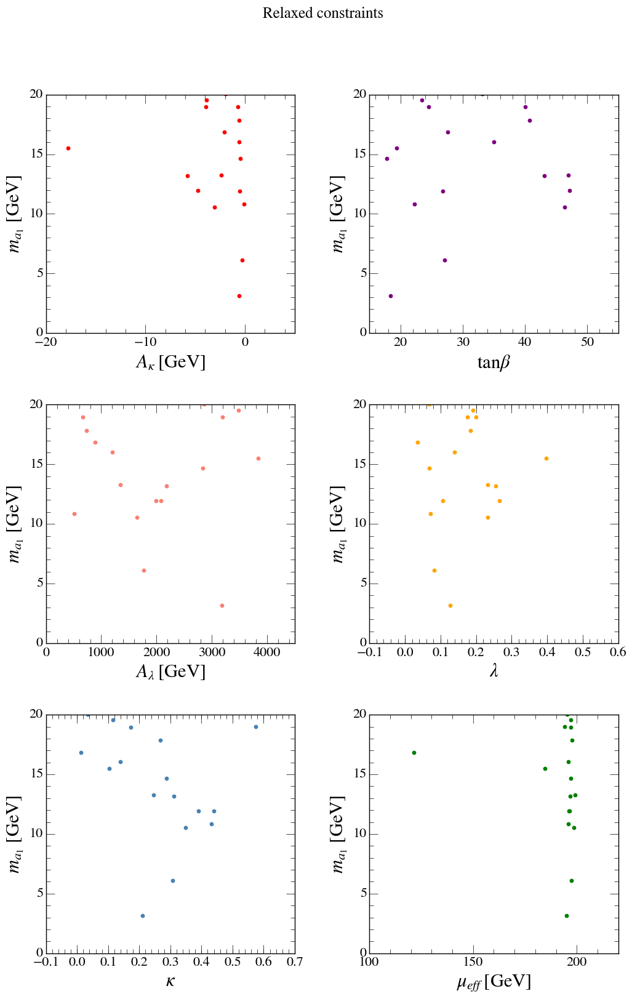

In [15]:
plot_ma1_inputparams(df_pass_all[df_pass_all.constraints == 'b -> c tau nu more than 2 sigma away (as SM)'], 
                     title, filename='Thesis_plots_2/ma1_inputparams_strict.png')

In [16]:
@save_fig
def plot_mh1_inputparams(df, title, yrange=[0, 150]):
    plot_input_params_scatters(df, 'mh1', r'$m_{h_1}\ \mathrm{[GeV]}$', 
                               yrange=yrange, 
                               title=title, cols=2, s=SIZE)

Setting backend png
Setting backend png


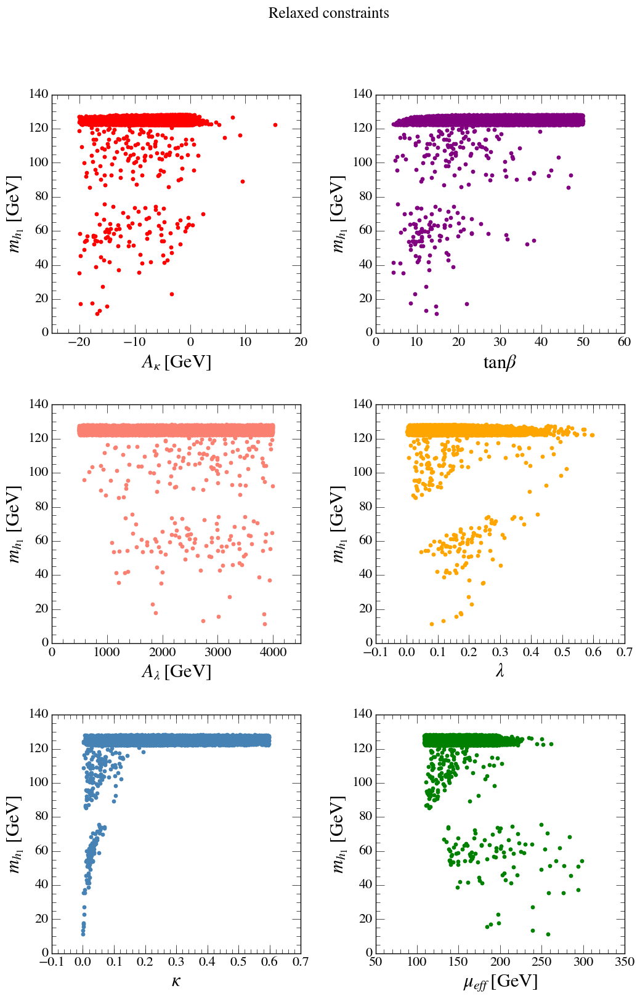

In [17]:
plot_mh1_inputparams(df_pass_all[~df_pass_all.constraints.str.contains('chi2')], 
                     title, filename='Thesis_plots_2/mh1_inputparams_relaxed_h125.png', yrange=[0, 140])

Setting backend png
Setting backend png


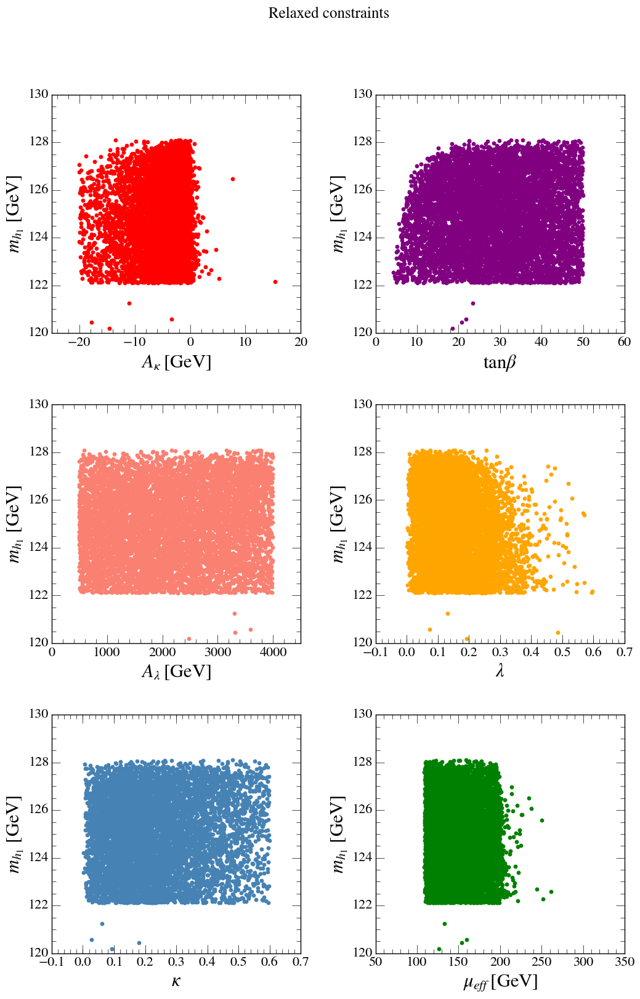

In [18]:
plot_mh1_inputparams(df_pass_all[~df_pass_all.constraints.str.contains('chi2')], 
                     title, filename='Thesis_plots_2/mh1_inputparams_relaxed.png', yrange=[120,130])

In [19]:
@save_fig
def plot_mh2_inputparams(df, title):
    plot_input_params_scatters(df, 'mh2', r'$m_{h_2}\ \mathrm{[GeV]}$', 
                               yrange=[120, 140], 
                               title=title, cols=2, s=SIZE)

Setting backend png
Setting backend png


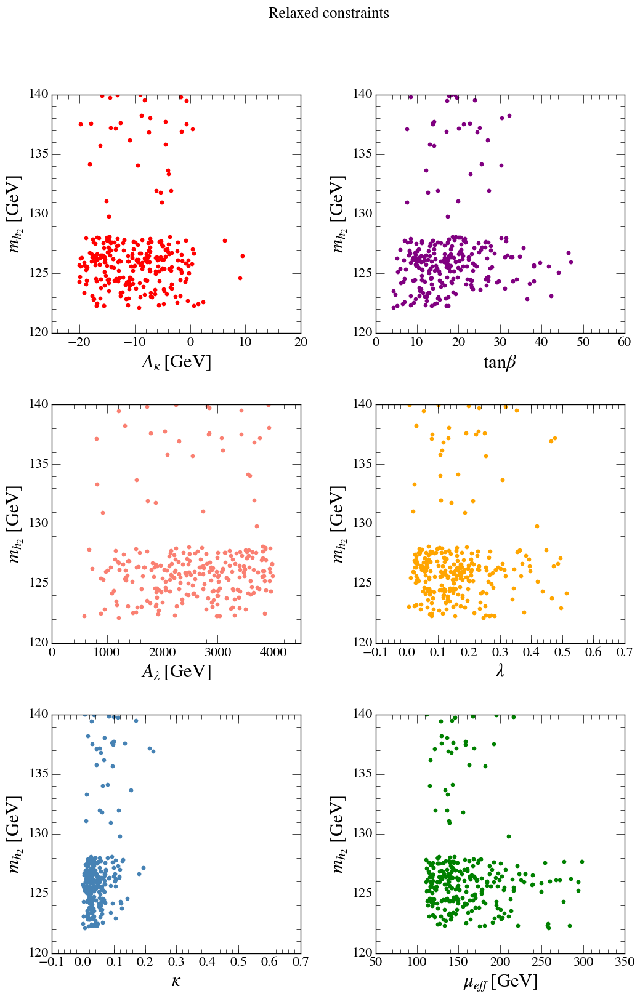

In [20]:
plot_mh2_inputparams(df_pass_all[~df_pass_all.constraints.str.contains('chi2')], 
                     title, filename='Thesis_plots_2/mh2_inputparams_relaxed.png')

In [21]:
title = ''

In [22]:
@save_fig
def plot_mh1_ma1_scatter(df, title):
    plot_scatter(df=df, xvar='ma1', yvar='mh1', 
                 xlabel=r'$m_{a_1}\ \mathrm{[GeV]}$', 
                 ylabel=r'$m_{h_1}\ \mathrm{[GeV]}$',
                 color='dodgerblue', s=SIZE)
    plt.xlim(0, 60)
    plt.ylim(0, 140)
    plt.title(title)
    
    xmin, xmax = plt.xlim()
    ymin, ymax = xmin, xmax
    plt.plot([xmin, xmax], [ymin, ymax], linestyle='dashed', 
             label=r'$m_{h_1} =\ m_{a_1}$', linewidth=2)

#     plt.plot([xmin, xmax], [2*ymin, 2*ymax], linestyle='dashed', color='red',
#              label=r'$m_{h_1} =\ 2m_{a_1}$', linewidth=2)

#     plt.plot([xmin, xmax], [62.5, 62.5], linestyle='dashed', color='purple',
#              label=r'$m_{h_1} =\ 62.5\ \mathrm{GeV}$', linewidth=2)

    make_highlight_region(plt.gca(), [125-3, 125+3], 
                          'Y', color='k', alpha=1, fill=False,
                          label=r'$125 \pm 3\ \mathrm{GeV}$', hatch='xxx')
    
#     make_highlight_region(plt.gca(), [0, 62.5], 
#                           'Y', color='darkorchid', alpha=0.25, fill=True,
#                           label=r'$h_2 \to 2h_1\ \mathrm{allowed}$')

#     poly = patches.Polygon([[0, 0], [60, 0], [60, 62.5], [62.5/2, 62.5]], closed=True, 
    poly = patches.Polygon([[0, 0], [60, 0], [60, 62.5], [0, 62.5]], closed=True, 
                           color='darkorchid', fill=True, hatch='//', 
                           label=r'$h_2 \to 2h_1\ \mathrm{allowed}$', alpha=0.25)
    plt.gca().add_patch(poly)
    
    poly2 = patches.Polygon([[0, 0], [62.5/2, 62.5], [0, 62.5]], closed=True, 
                           fill=True, color='red', hatch=r"\\",
                           label=r'$h_2 \to 2h_1 \to 4a_1\ \mathrm{allowed}$', alpha=0.25)
    plt.gca().add_patch(poly2)

#     make_highlight_region(plt.gca(), [0, 62.5], 
#                           'Y', color='purple', alpha=0.2,
#                           label=r'$h_2 \to 2h_1\ \mathrm{allowed}$')

    plt.legend(loc='lower right', frameon=True, bbox_to_anchor=(1,0), framealpha=0.8, fontsize=14)
    plt.tight_layout()


Setting backend png
Setting backend png


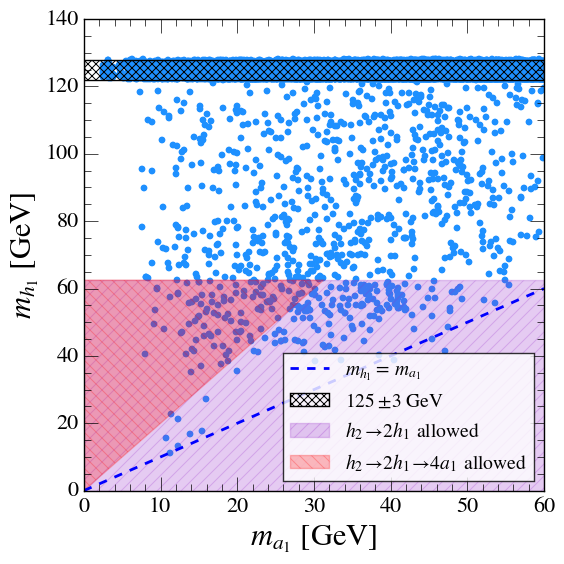

In [23]:
plot_mh1_ma1_scatter(df_pass_all, title, filename='Thesis_plots_2/mh1_ma1_relaxed.png')

(<matplotlib.axes._subplots.AxesSubplot at 0x112ea2550>,
 <matplotlib.collections.PathCollection at 0x109aa1090>)

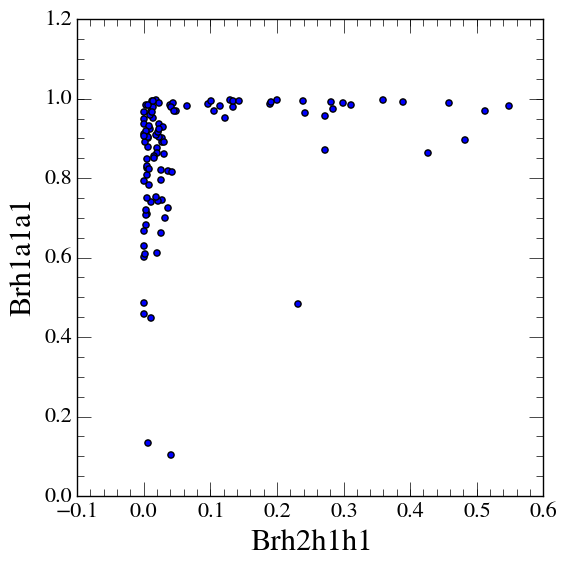

In [24]:
plot_scatter(df=df_pass_all.query('mh2 < 128.1'), xvar='Brh2h1h1', yvar='Brh1a1a1')

In [25]:
dff = df_pass_all.query('mh2<128.1')
nu_tautau =  dff['xsec_8_ggf_h2_2h1_4b'] * dff['Brh1a1a1'] * dff['Brh1a1a1'] * dff['Bra1tautau'] * dff['Bra1tautau'] / (dff['Brh1bb'] * dff['Brh1bb'])
nu_tautau = nu_tautau.dropna()

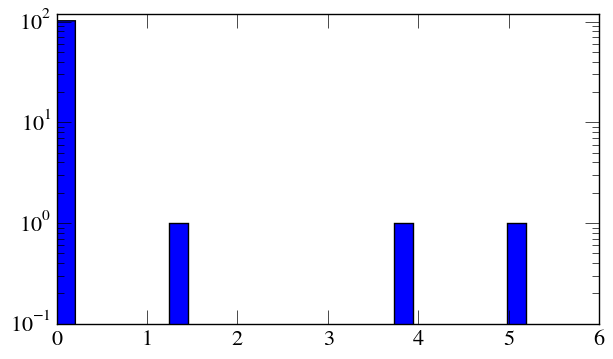

In [26]:
plt.hist(nu_tautau.values, bins=25)
plt.ylim(bottom=0.1)
plt.yscale('log')

In [27]:
dff = df_pass_all.query('mh2<128.1')
nu_bb =  dff['xsec_8_ggf_h2_2h1_4b'] * dff['Brh1a1a1'] * dff['Brh1a1a1'] * dff['Bra1bb'] * dff['Bra1bb'] / (dff['Brh1bb'] * dff['Brh1bb'])
nu_bb = nu_bb.dropna()

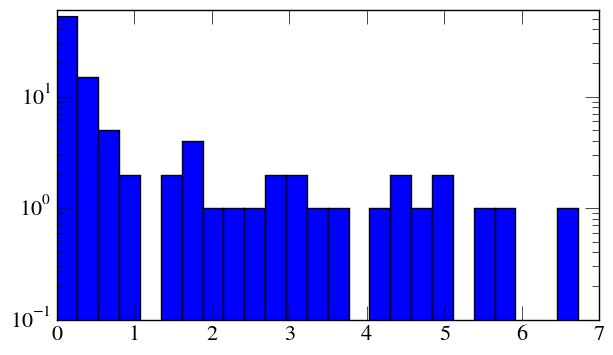

In [28]:
plt.hist(nu_bb.values, bins=25)
plt.ylim(bottom=0.1)
plt.yscale('log')

In [29]:
@save_fig
def plot_mh2_ma1_scatter(df, title):
    plot_scatter(df=df, xvar='ma1', yvar='mh2', 
                 xlabel=r'$m_{a_1}\ \mathrm{[GeV]}$', 
                 ylabel=r'$m_{h_2}\ \mathrm{[GeV]}$', 
                 color='green', s=SIZE)
    plt.xlim(0, 60)
    plt.ylim(80, 320)
#     plt.yscale('log')
    plt.title(title)
    make_highlight_region(plt.gca(), [125-3, 125+3], 
                          'Y', color='k', alpha=1, fill=False, hatch="xxx", 
                          label=r'$125 \pm 3\ \mathrm{GeV}$')
    plt.legend(loc='lower right', frameon=False)
    plt.tight_layout()


Setting backend png
Setting backend png


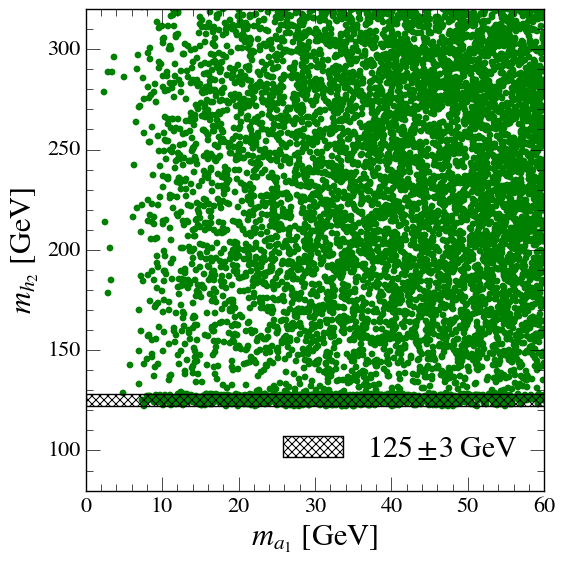

In [30]:
plot_mh2_ma1_scatter(df_pass_all, title, filename='Thesis_plots_2/mh2_ma1_relaxed.png')

In [31]:
@save_fig
def plot_mh2_mh1_scatter(df, title):
    plot_scatter(df=df, xvar='mh1', yvar='mh2', 
                 xlabel=r'$m_{h_1}\ \mathrm{[GeV]}$', 
                 ylabel=r'$m_{h_2}\ \mathrm{[GeV]}$',
                 color='red', s=SIZE)
    plt.xlim(0, 140)
    plt.ylim(80, 320)
    
    xmin, xmax = plt.xlim()
    ymin, ymax = xmin, xmax
    plt.plot([xmin, xmax], [ymin, ymax], linestyle='dashed', 
             label=r'$m_{h_2} =\ m_{h_1}$', linewidth=2)

    plt.title(title)
    make_highlight_region(plt.gca(), [125-3, 125+3], 
                          'X', color='k', alpha=1, fill=False, hatch='xxx')
    make_highlight_region(plt.gca(), [125-3, 125+3], 
                          'Y', color='k', alpha=1, fill=False, hatch='xxx', 
                          label=r'$125 \pm 3\ \mathrm{GeV}$')
    plt.legend(loc='upper left', frameon=False)
    plt.tight_layout()

Setting backend png
Setting backend png


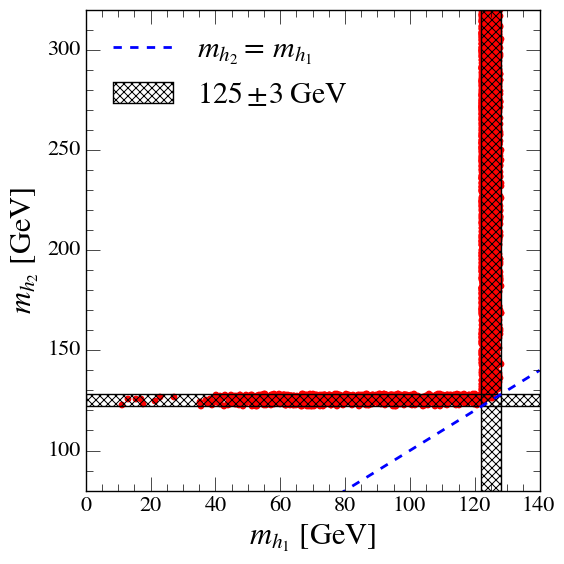

In [32]:
plot_mh2_mh1_scatter(df_pass_all, title, filename='Thesis_plots_2/mh2_mh1_relaxed.png')

In [33]:
import math

def plot_contours(ax, xlim=[0, 1], ylim=[0, 1], n_div=15, log_steps=False):
    """For contours of constant BR * ggh^2"""
    delta = min(xlim[1], ylim[1])/40.
    # generate a grid of x and y values
    x = np.arange(xlim[0], xlim[1]+delta, delta)
    y = np.arange(ylim[0], ylim[1]+delta, delta)
    X, Y = np.meshgrid(x, y)
    # generate a grid of the product of these values
    Z = X * Y

    if log_steps:
        max_v = xlim[1] * ylim[1]
        min_v = xlim[0] * ylim[0]
        print math.log(max_v, 10)-5, math.log(max_v, 10)+1
        n_div = np.logspace( math.log(max_v, 10)-5, math.log(max_v, 10)+1, num=7)

    manual_locations = [(math.sqrt(x), math.sqrt(x)) for x in n_div]
    manual_locations[-1] = (0.55, n_div[-1]/0.55)
    CS = ax.contour(X, Y, Z, n_div, colors='k')
    ax.clabel(CS, inline=1, fontsize=16, fmt='%g', manual=manual_locations)


@save_fig    
def plot_grc2_br(df, mass_range, title):
    fig, ax = generate_fig_axes(size=(8,7))

    n_div = [1E-2, 2E-2, 5E-2, 1E-1, 2E-1, 5E-1]
    plot_contours(plt.gca(), n_div=n_div)

    F = 3

    df = df.query('%f<ma1<%f' % (mass_range[0], mass_range[1]))
    plot_scatter(ax=ax, df=df.query('122.1 < mh1 < 128.1 & mh2>128.1'), 
                 xvar='h1ggrc2', yvar='Brh1a1a1', color='blue', 
                 label=r'$h_{125} = h_1,\ h_i = h_1,\ X = a_1$',
                 marker='s', s=F*SIZE, alpha=0.75)
    plot_scatter(ax=plt.gca(), df=df.query('122.1 < mh2 < 128.1'), 
                 xvar='h2ggrc2', yvar='Brh2a1a1', color='red', 
                 label=r'$h_{125} = h_2,\ h_i = h_2,\ X = a_1$',
                 marker='o', s=F*SIZE, alpha=0.95)
    plot_scatter(ax=plt.gca(), df=df.query('122.1 < mh1 < 128.1 & mh2>128.1'), 
                 label=r'$h_{125} = h_1,\ h_i = h_2,\ X = a_1$',
                 xvar='h2ggrc2', yvar='Brh2a1a1', color='purple', 
                 marker='s', s=F*SIZE, alpha=0.75)
    plot_scatter(ax=plt.gca(), df=df.query('122.1 < mh2 < 128.1'), 
                 label=r'$h_{125} = h_2,\ h_i = h_1,\ X = a_1$',
                 xvar='h1ggrc2', yvar='Brh1a1a1', color='green', 
                 marker='o', s=F*SIZE, alpha=0.95)

    plot_scatter(ax=plt.gca(), df=df.query('%f<mh1<%f & 122.1 < mh2 < 128.1' % (mass_range[0], mass_range[1])), 
                 label=r'$h_{125} = h_2,\ h_i = h_2,\ X = h_1$',
                 xvar='h2ggrc2', yvar='Brh2h1h1', color='orange', 
                 marker='^', s=F*SIZE, alpha=0.95)

    plt.xlim(-0.1, 1.1)
    plt.ylim(-0.1, 1.1)


    plt.xlabel(r'$g_{ggh_i}^2$')
    plt.ylabel(r'$BR(h_i \to XX)$')

    plt.legend(loc='upper right', fontsize=15, framealpha=0.85, frameon=False)

    plt.title(title)
    plt.tight_layout()

In [34]:
low_mass_title = r'$m_{X} < 10.5\ \mathrm{GeV}$'
hi_mass_title = r'$12 < m_{X} < 62\ \mathrm{GeV}$'

Setting backend pdf


/Users/robina/.virtualenvs/NMSSMScan/lib/python2.7/site-packages/matplotlib/collections.py:650: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if self._edgecolors_original != str('face'):
/Users/robina/.virtualenvs/NMSSMScan/lib/python2.7/site-packages/matplotlib/text.py:52: UnicodeWarning: Unicode equal comparison failed to convert both arguments to Unicode - interpreting them as being unequal
  if rotation in ('horizontal', None):
/Users/robina/.virtualenvs/NMSSMScan/lib/python2.7/site-packages/matplotlib/text.py:54: UnicodeWarning: Unicode equal comparison failed to convert both arguments to Unicode - interpreting them as being unequal
  elif rotation == 'vertical':


Setting backend png


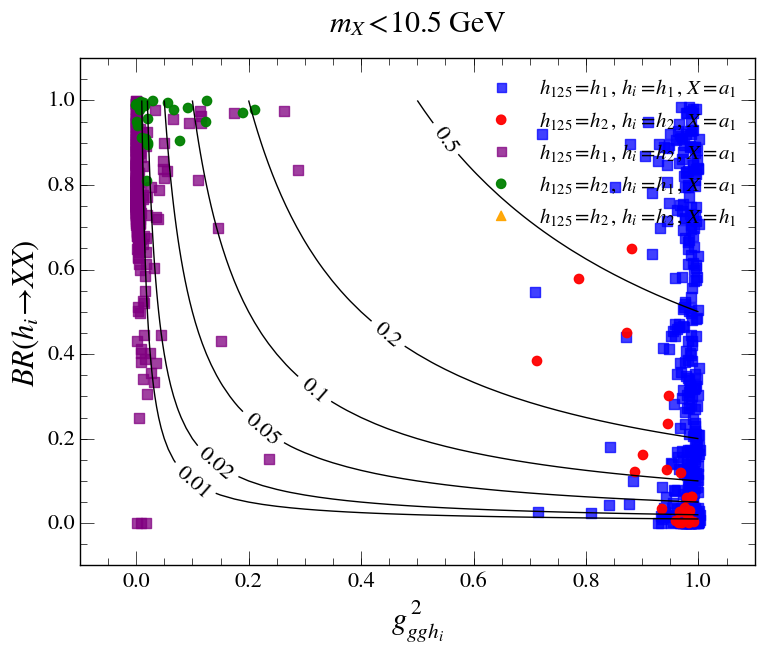

In [35]:
plot_grc2_br(df_pass_all, [0, 10.5], low_mass_title, filename='Thesis_plots_2/rc2_br_ma1Lt10p5.pdf')

Setting backend pdf
Setting backend png


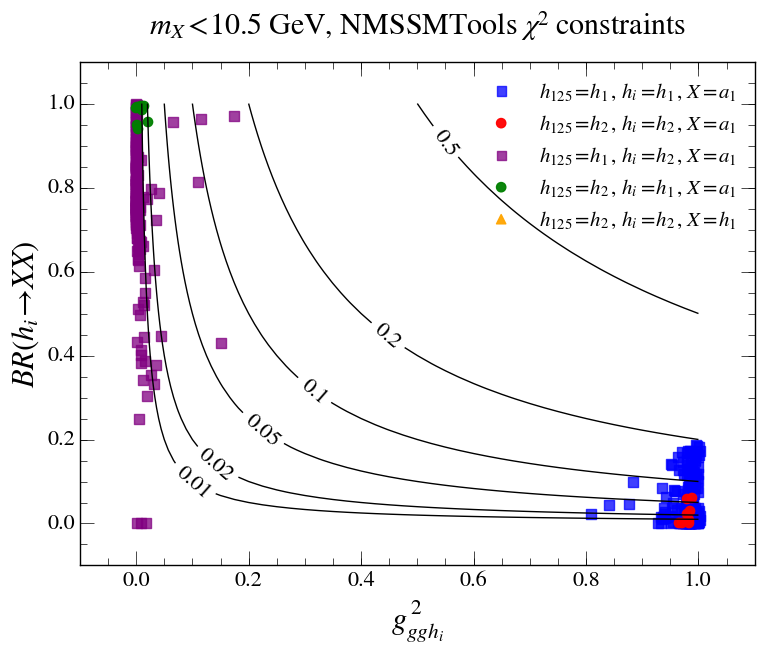

In [36]:
plot_grc2_br(df_pass_all[~df_pass_all.constraints.str.contains('chi2')], [0, 10.5], 
             low_mass_title + ", NMSSMTools " + r'$\chi^2$' + 'constraints', 
             filename='Thesis_plots_2/rc2_br_ma1Lt10p5_NT.pdf')

Setting backend pdf
Setting backend png


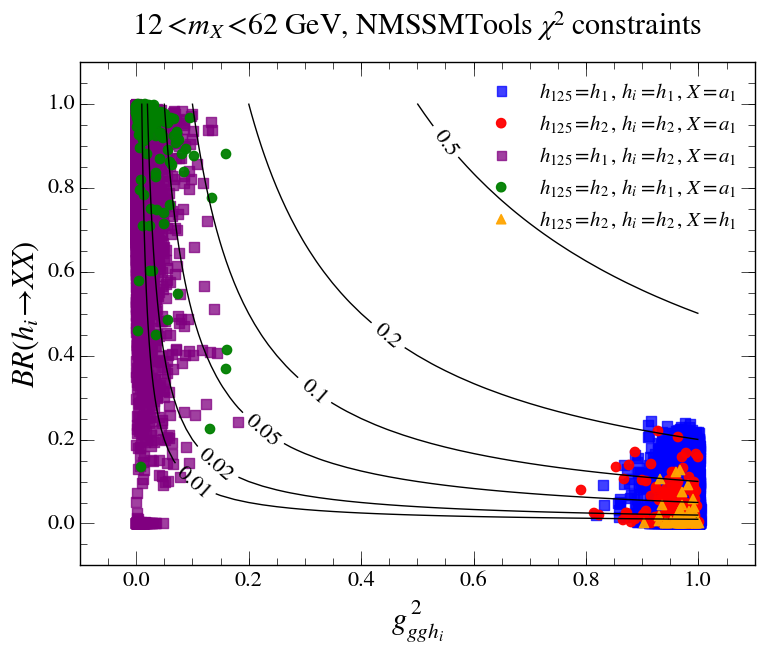

In [37]:
plot_grc2_br(df_pass_all[~df_pass_all.constraints.str.contains('chi2')], [12, 62], 
             hi_mass_title + ", NMSSMTools " + r'$\chi^2$' + 'constraints', 
             filename='Thesis_plots_2/rc2_br_ma1Gt12_NT.pdf')

Setting backend pdf
Setting backend png


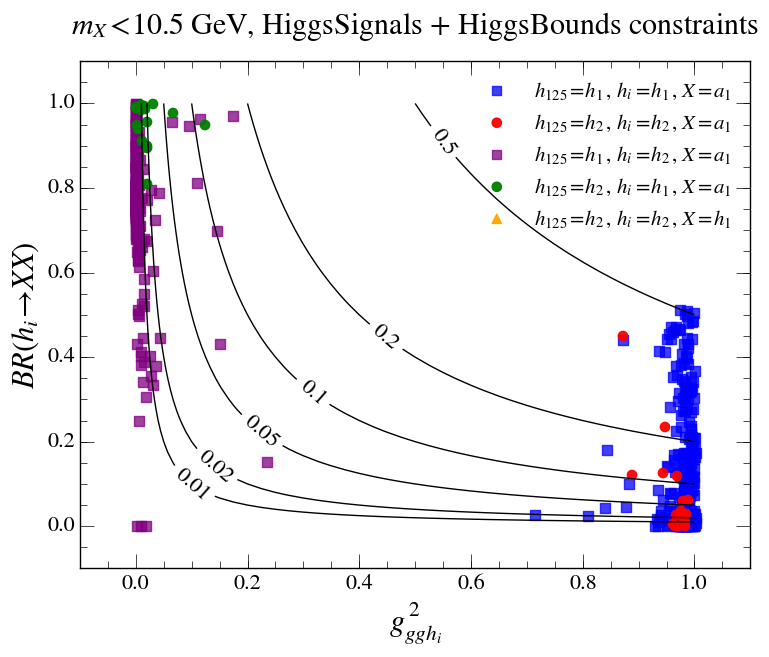

In [38]:
plot_grc2_br(df_pass_all.query('HSprob>0.05 & HBresult==1'), [0, 10.5],
             low_mass_title + ', HiggsSignals + HiggsBounds constraints', 
             filename='Thesis_plots_2/rc2_br_ma1Lt10p5_HSHB.pdf')

Setting backend pdf
Setting backend png


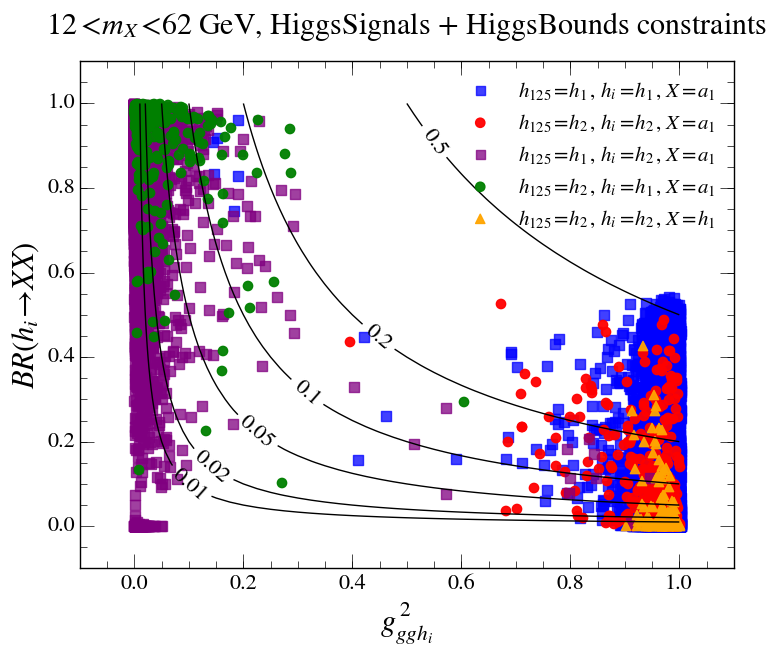

In [39]:
plot_grc2_br(df_pass_all.query('HSprob>0.05 & HBresult==1'), [12, 62],
             hi_mass_title + ', HiggsSignals + HiggsBounds constraints', 
             filename='Thesis_plots_2/rc2_br_ma1Gt12_HSHB.pdf')

In [40]:
@save_fig
def plot_h1BR_NT_HSHB(df, title, var, xlim, xlabel):
    df = df.query('122.2 < mh1 < 128.1 & mh2>128.1 & ma1<10.5')

    nbins = 50
    lw = 1
    norm = False
    err = False
    
    pass_zz = ~df.constraints.str.contains('ZZ')
    plot_histogram(df=df[pass_zz], var=var, bins=nbins, range=xlim, 
                   label='Pass NT '+r'$ZZ\ \chi^2$', histtype='step', linewidth=lw, 
                   errorbars=err, normed=norm)
    
    pass_bb = ~df.constraints.str.contains('bb')
    plot_histogram(ax=plt.gca(), df=df[pass_bb], var=var, bins=nbins, range=xlim, 
                   label='Pass NT '+r'$b\bar{b}\ \chi^2$', histtype='step', linewidth=lw, 
                   errorbars=err, normed=norm)
    
    pass_gg = ~df.constraints.str.contains('gg')
    plot_histogram(ax=plt.gca(), df=df[pass_gg], var=var, bins=nbins, range=xlim, 
                   label='Pass NT '+r'$\gamma\gamma\ \chi^2$', histtype='step', linewidth=lw, 
                   errorbars=err, normed=norm, color='purple')

    pass_nt = ~df.constraints.str.contains('chi2')
    plot_histogram(ax=plt.gca(), df=df[pass_nt], var=var, bins=nbins, range=xlim, 
                   label='Pass NT all '+r'$\chi^2$', histtype='step', linewidth=2*lw, 
                   errorbars=err, normed=norm, color='darkorange', linestyle='dashed')

    pass_HBHS = (df.HBresult==1) & (df.HSprob>0.05)
    plot_histogram(ax=plt.gca(), df=df[pass_HBHS], var=var, bins=nbins, range=xlim, 
                   label='Pass HS + HB', histtype='step', linewidth=lw,
                   errorbars=False, normed=norm)

    plt.xlabel(xlabel)
    plt.xlim(*xlim)
#     plt.ylim(1, 5E4)
    plt.yscale('log')
    plt.legend(loc='best', fontsize=16, frameon=False)

Setting backend pdf
Setting backend png


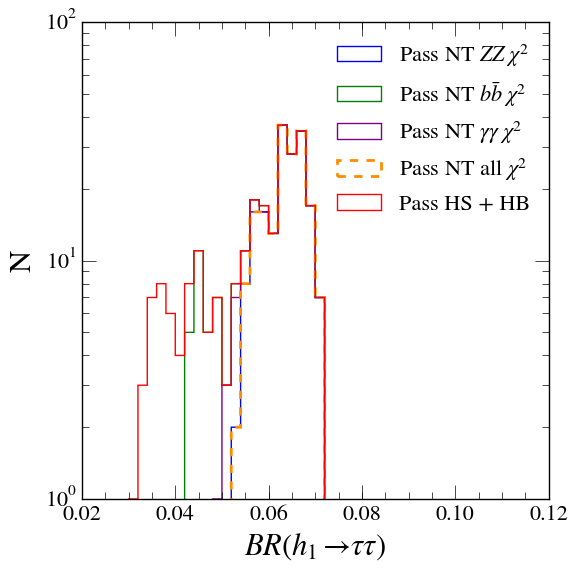

In [41]:
plot_h1BR_NT_HSHB(df_pass_all, title='', var='Brh1tautau', 
                  xlim=[0.02, .12], xlabel=r'$BR(h_1 \to \tau\tau)$', 
                  filename='Thesis_plots_2/h1tautau_NT_HSHB.pdf')

Setting backend pdf
Setting backend png


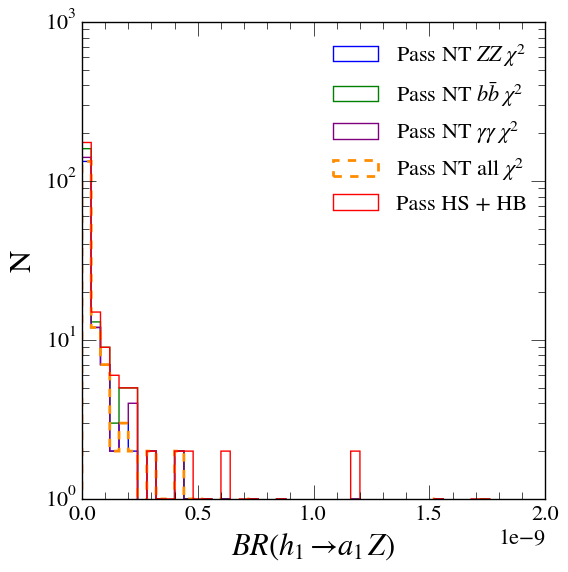

In [42]:
plot_h1BR_NT_HSHB(df_pass_all, title='', var='Brh1a1z', 
                  xlim=[0, 2E-9], xlabel=r'$BR(h_1 \to a_1Z)$', 
                  filename='Thesis_plots_2/h1a1z_NT_HSHB.pdf')

Setting backend pdf
Setting backend png


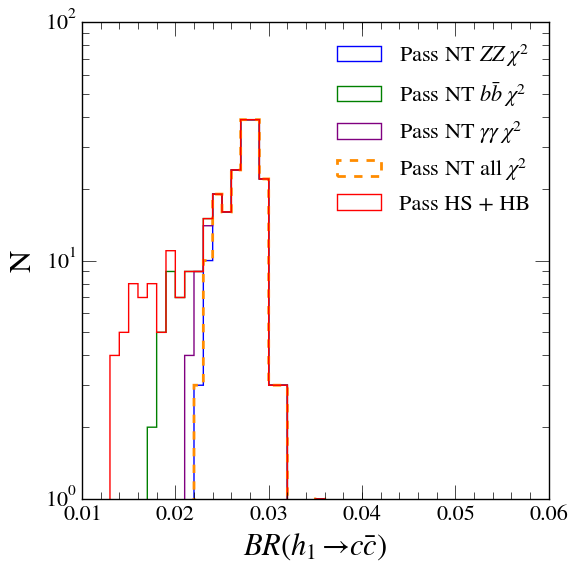

In [43]:
plot_h1BR_NT_HSHB(df_pass_all, title='', var='Brh1cc', 
                  xlim=[0.01, 6E-2], xlabel=r'$BR(h_1 \to c\bar{c})$', 
                  filename='Thesis_plots_2/h1cc_NT_HSHB.pdf')

In [44]:
@save_fig
def plot_h1zz_NT_HSHB(df, title):
    df = df.query('122.2 < mh1 < 128.1 & mh2>128.1 & ma1<10.5')

    var = 'Brh1zz'
    nbins = 30
    xlim = [0, 6E-2]
    lw = 1
    norm = False
    err = False
    
    pass_zz = ~df.constraints.str.contains('ZZ')
    plot_histogram(df=df[pass_zz], var=var, bins=nbins, range=xlim, 
                   label='Pass NT '+r'$ZZ\ \chi^2$', histtype='step', linewidth=lw, 
                   errorbars=err, normed=norm)
    
    pass_bb = ~df.constraints.str.contains('bb')
    plot_histogram(ax=plt.gca(), df=df[pass_bb], var=var, bins=nbins, range=xlim, 
                   label='Pass NT '+r'$b\bar{b}\ \chi^2$', histtype='step', linewidth=lw, 
                   errorbars=err, normed=norm)
    
    pass_gg = ~df.constraints.str.contains('gg')
    plot_histogram(ax=plt.gca(), df=df[pass_gg], var=var, bins=nbins, range=xlim, 
                   label='Pass NT '+r'$\gamma\gamma\ \chi^2$', histtype='step', linewidth=lw, 
                   errorbars=err, normed=norm, color='purple')

    pass_nt = ~df.constraints.str.contains('chi2')
    plot_histogram(ax=plt.gca(), df=df[pass_nt], var=var, bins=nbins, range=xlim, 
                   label='Pass NT all '+r'$\chi^2$', histtype='step', linewidth=2*lw, 
                   errorbars=err, normed=norm, color='darkorange', linestyle='dashed')

    pass_HBHS = (df.HBresult==1) & (df.HSprob>0.05)
    plot_histogram(ax=plt.gca(), df=df[pass_HBHS], var=var, bins=nbins, range=xlim, 
                   label='Pass HS + HB', histtype='step', linewidth=lw,
                   errorbars=False, normed=norm)
    
    plt.xlabel(r'$BR(h_1 \to ZZ)$')
    plt.xlim(*xlim)
    plt.legend(loc='best', fontsize=16, frameon=False)
#     plt.ylim(1, 2E3)
    plt.yscale('log')

Setting backend pdf
Setting backend png


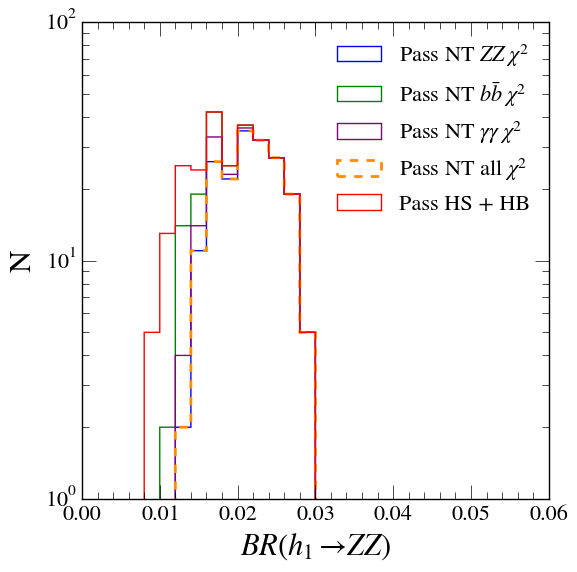

In [45]:
plot_h1zz_NT_HSHB(df_pass_all, '', filename='Thesis_plots_2/h1zz_NT_HSHB.pdf')

In [46]:
@save_fig
def plot_h1bb_NT_HSHB(df, title):
    df = df.query('122.2 < mh1 < 128.1 & mh2>128.1 & ma1<10.5')

    var = 'Brh1bb'
    xlim = [0.2, 0.7]
    nbins = 25
    lw = 1
    norm = False
    err = False
    
    pass_zz = ~df.constraints.str.contains('ZZ')
    plot_histogram(df=df[pass_zz], var=var, bins=nbins, range=xlim, 
                   label='Pass NT '+r'$ZZ\ \chi^2$', histtype='step', linewidth=lw, 
                   errorbars=err, normed=norm)
    
    pass_bb = ~df.constraints.str.contains('bb')
    plot_histogram(ax=plt.gca(), df=df[pass_bb], var=var, bins=nbins, range=xlim, 
                   label='Pass NT '+r'$b\bar{b}\ \chi^2$', histtype='step', linewidth=lw, 
                   errorbars=err, normed=norm)
    
    pass_gg = ~df.constraints.str.contains('gg')
    plot_histogram(ax=plt.gca(), df=df[pass_gg], var=var, bins=nbins, range=xlim, 
                   label='Pass NT '+r'$\gamma\gamma\ \chi^2$', histtype='step', linewidth=lw, 
                   errorbars=err, normed=norm, color='purple')

    pass_nt = ~df.constraints.str.contains('chi2')
    plot_histogram(ax=plt.gca(), df=df[pass_nt], var=var, bins=nbins, range=xlim, 
                   label='Pass NT all '+r'$\chi^2$', histtype='step', linewidth=2*lw, 
                   errorbars=err, normed=norm, color='darkorange', linestyle='dashed')

    pass_HBHS = (df.HBresult==1) & (df.HSprob>0.05)
    plot_histogram(ax=plt.gca(), df=df[pass_HBHS], var=var, bins=nbins, range=xlim, 
                   label='Pass HS + HB', histtype='step', linewidth=lw, #linestyle='dashed',
                   errorbars=False, normed=norm)
    
    plt.xlabel(r'$BR(h_1 \to b\bar{b})$')
    plt.xlim(*xlim)
    plt.legend(loc='upper left', fontsize=16, frameon=False)
#     plt.ylim(1, 7.5E4)
    plt.yscale('log')

Setting backend pdf
Setting backend png


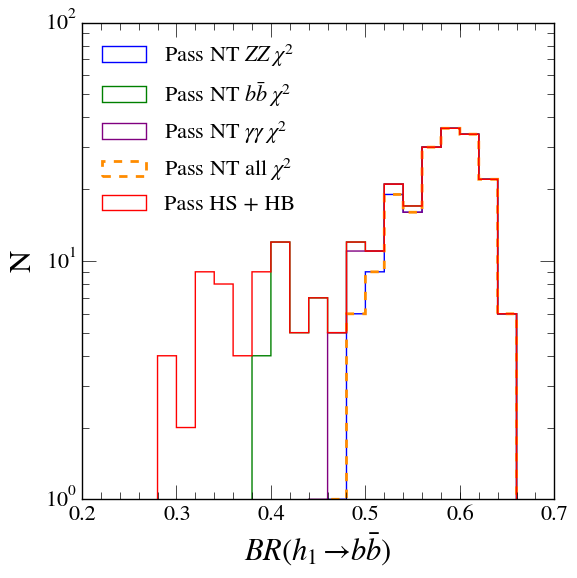

In [47]:
plot_h1bb_NT_HSHB(df_pass_all, '', filename='Thesis_plots_2/h1bb_NT_HSHB.pdf')

In [48]:
@save_fig
def plot_h1gluglu_NT_HSHB(df, title):
    df = df.query('122.2 < mh1 < 128.1 & mh2>128.1 & ma1<10.5')

    var = 'Brh1gg'
    xlim = [0.02, 0.12]
    nbins = 25
    lw = 1
    norm = False
    err = False
    
    pass_zz = ~df.constraints.str.contains('ZZ')
    plot_histogram(df=df[pass_zz], var=var, bins=nbins, range=xlim, 
                   label='Pass NT '+r'$ZZ\ \chi^2$', histtype='step', linewidth=lw, 
                   errorbars=err, normed=norm)
    
    pass_bb = ~df.constraints.str.contains('bb')
    plot_histogram(ax=plt.gca(), df=df[pass_bb], var=var, bins=nbins, range=xlim, 
                   label='Pass NT '+r'$b\bar{b}\ \chi^2$', histtype='step', linewidth=lw, 
                   errorbars=err, normed=norm)
    
    pass_gg = ~df.constraints.str.contains('gg')
    plot_histogram(ax=plt.gca(), df=df[pass_gg], var=var, bins=nbins, range=xlim, 
                   label='Pass NT '+r'$\gamma\gamma\ \chi^2$', histtype='step', linewidth=lw, 
                   errorbars=err, normed=norm, color='purple')

    pass_nt = ~df.constraints.str.contains('chi2')
    plot_histogram(ax=plt.gca(), df=df[pass_nt], var=var, bins=nbins, range=xlim, 
                   label='Pass NT all '+r'$\chi^2$', histtype='step', linewidth=2*lw, 
                   errorbars=err, normed=norm, color='darkorange', linestyle='dashed')

    pass_HBHS = (df.HBresult==1) & (df.HSprob>0.05)
    plot_histogram(ax=plt.gca(), df=df[pass_HBHS], var=var, bins=nbins, range=xlim, 
                   label='Pass HS + HB', histtype='step', linewidth=lw, #linestyle='dashed',
                   errorbars=False, normed=norm)
    
    plt.xlim(*xlim)
    plt.xlabel(r'$BR(h_1 \to gg)$')
    plt.legend(loc='upper right', fontsize=16, frameon=False)
#     plt.ylim(1, 5E3)
    plt.yscale('log')

Setting backend pdf
Setting backend png


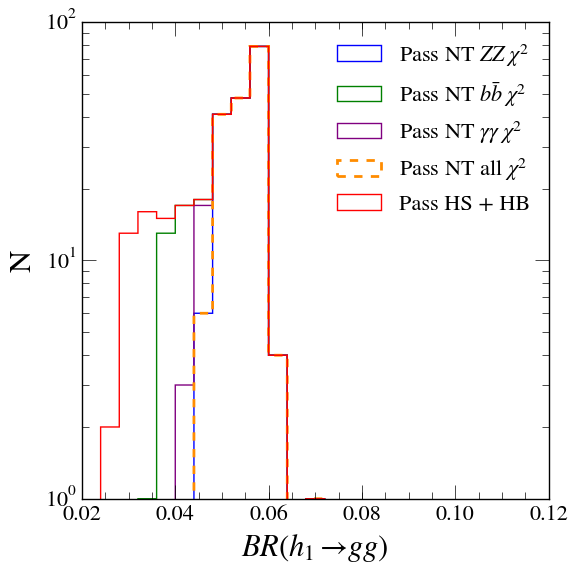

In [49]:
plot_h1gluglu_NT_HSHB(df_pass_all, '', filename='Thesis_plots_2/h1gluglu_NT_HSHB.pdf')

In [50]:
@save_fig
def plot_h1gammagamma_NT_HSHB(df, title):
    df = df.query('122.2 < mh1 < 128.1 & mh2>128.1 & ma1<10.5')

    var = 'Brh1gammagamma'
    xlim = [0, 0.005]
    nbins = 25
    lw = 1
    norm = False
    err = False
    
    pass_zz = ~df.constraints.str.contains('ZZ')
    plot_histogram(df=df[pass_zz], var=var, bins=nbins, range=xlim, 
                   label='Pass NT '+r'$ZZ\ \chi^2$', histtype='step', linewidth=lw, 
                   errorbars=err, normed=norm)
    
    pass_bb = ~df.constraints.str.contains('bb')
    plot_histogram(ax=plt.gca(), df=df[pass_bb], var=var, bins=nbins, range=xlim, 
                   label='Pass NT '+r'$b\bar{b}\ \chi^2$', histtype='step', linewidth=lw, 
                   errorbars=err, normed=norm)
    
    pass_gg = ~df.constraints.str.contains('gg')
    plot_histogram(ax=plt.gca(), df=df[pass_gg], var=var, bins=nbins, range=xlim, 
                   label='Pass NT '+r'$\gamma\gamma\ \chi^2$', histtype='step', linewidth=lw, 
                   errorbars=err, normed=norm, color='purple')

    pass_nt = ~df.constraints.str.contains('chi2')
    plot_histogram(ax=plt.gca(), df=df[pass_nt], var=var, bins=nbins, range=xlim, 
                   label='Pass NT all '+r'$\chi^2$', histtype='step', linewidth=2*lw, 
                   errorbars=err, normed=norm, color='darkorange', linestyle='dashed')

    pass_HBHS = (df.HBresult==1) & (df.HSprob>0.05)
    plot_histogram(ax=plt.gca(), df=df[pass_HBHS], var=var, bins=nbins, range=xlim, 
                   label='Pass HS + HB', histtype='step', linewidth=lw, #linestyle='dashed',
                   errorbars=False, normed=norm)
    
    plt.xlim(*xlim)
    plt.xlabel(r'$BR(h_1 \to \gamma\gamma)$')
    plt.legend(loc='upper right', fontsize=16, frameon=False)
#     plt.ylim(1, 5E4)
    plt.yscale('log')

Setting backend pdf
Setting backend png


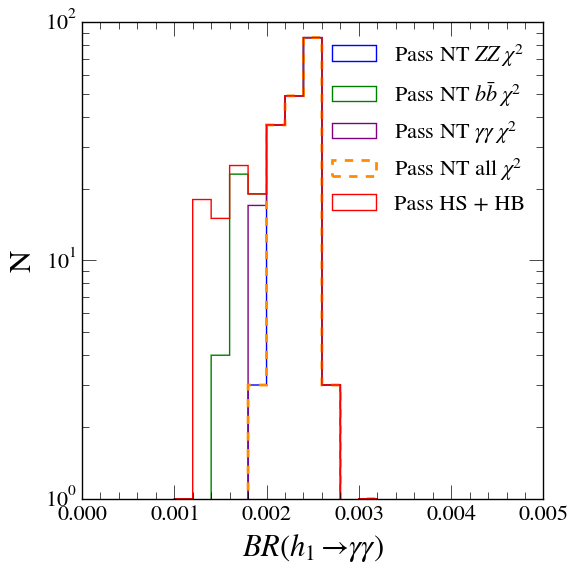

In [51]:
plot_h1gammagamma_NT_HSHB(df_pass_all, '', filename='Thesis_plots_2/h1gammagamma_NT_HSHB.pdf')

In [52]:
@save_fig
def plot_h1a1a1_NT_HSHB(df, title):
    
    df = df.query('122.1 < mh1 < 128.1 & mh2>128.1 & ma1<10.5')
    
    var = 'Brh1a1a1'
    nbins = 25
    xlim = [0, 0.75]
    norm = False
    lw = 1
    err = False
    
    pass_zz = ~df.constraints.str.contains('ZZ')
    plot_histogram(df=df[pass_zz], var=var, bins=nbins, range=xlim, 
                   label='Pass NT '+r'$ZZ\ \chi^2$', histtype='step', linewidth=lw, 
                   errorbars=err, normed=norm)
    
    pass_bb = ~df.constraints.str.contains('bb')
    plot_histogram(ax=plt.gca(), df=df[pass_bb], var=var, bins=nbins, range=xlim, 
                   label='Pass NT '+r'$b\bar{b}\ \chi^2$', histtype='step', linewidth=lw, 
                   errorbars=err, normed=norm)
    
    pass_gg = ~df.constraints.str.contains('gg')
    plot_histogram(ax=plt.gca(), df=df[pass_gg], var=var, bins=nbins, range=xlim, 
                   label='Pass NT '+r'$\gamma\gamma\ \chi^2$', histtype='step', linewidth=lw, 
                   errorbars=err, normed=norm, color='purple')

    pass_nt = ~df.constraints.str.contains('chi2')
    plot_histogram(ax=plt.gca(), df=df[pass_nt], var=var, bins=nbins, range=xlim, 
                   label='Pass NT all '+r'$\chi^2$', histtype='step', linewidth=2*lw, 
                   errorbars=err, normed=norm, color='darkorange', linestyle='dashed')
    
    pass_HBHS = (df.HBresult==1) & (df.HSprob>0.05)
    plot_histogram(ax=plt.gca(), df=df[pass_HBHS], var=var, bins=nbins, range=xlim, 
                   label='Pass HS + HB', histtype='step', linewidth=lw, #linestyle='dashed',
                   errorbars=err, normed=norm, color='red')

    plt.xlim(*xlim)
    plt.xlabel(r'$BR(h_1 \to a_1a_1)$')
    plt.legend(loc='upper right', fontsize=16, frameon=False)
#     plt.ylim(1E-3, 1)
    plt.yscale('log')

Setting backend pdf
Setting backend png


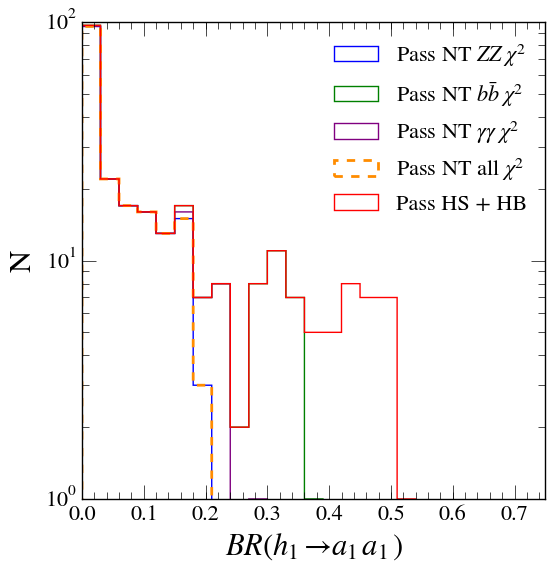

In [53]:
plot_h1a1a1_NT_HSHB(df_pass_all, '', filename='Thesis_plots_2/h1a1a1_NT_HSHB.pdf')

In [54]:
@save_fig
def plot_h1ww_NT_HSHB(df, title):
    
    df = df.query('122.1 < mh1 < 128.1 & mh2>128.1 & ma1<10.5')
    
    var = 'Brh1ww'
    nbins = 30
    xlim = [0, 0.3]
    norm = False
    lw = 1
    err = False
    
    pass_zz = ~df.constraints.str.contains('ZZ')
    plot_histogram(df=df[pass_zz], var=var, bins=nbins, range=xlim, 
                   label='Pass NT '+r'$ZZ\ \chi^2$', histtype='step', linewidth=lw, 
                   errorbars=err, normed=norm)
    
    pass_bb = ~df.constraints.str.contains('bb')
    plot_histogram(ax=plt.gca(), df=df[pass_bb], var=var, bins=nbins, range=xlim, 
                   label='Pass NT '+r'$b\bar{b}\ \chi^2$', histtype='step', linewidth=lw, 
                   errorbars=err, normed=norm)
    
    pass_gg = ~df.constraints.str.contains('gg')
    plot_histogram(ax=plt.gca(), df=df[pass_gg], var=var, bins=nbins, range=xlim, 
                   label='Pass NT '+r'$\gamma\gamma\ \chi^2$', histtype='step', linewidth=lw, 
                   errorbars=err, normed=norm, color='purple')

    pass_nt = ~df.constraints.str.contains('chi2')
    plot_histogram(ax=plt.gca(), df=df[pass_nt], var=var, bins=nbins, range=xlim, 
                   label='Pass NT all '+r'$\chi^2$', histtype='step', linewidth=2*lw, 
                   errorbars=err, normed=norm, color='darkorange', linestyle='dashed')
    
    pass_HBHS = (df.HBresult==1) & (df.HSprob>0.05)
    plot_histogram(ax=plt.gca(), df=df[pass_HBHS], var=var, bins=nbins, range=xlim, 
                   label='Pass HS + HB', histtype='step', linewidth=lw, #linestyle='dashed',
                   errorbars=err, normed=norm, color='red')

    plt.xlim(*xlim)
    plt.xlabel(r'$BR(h_1 \to WW)$')
    plt.legend(loc='upper left', fontsize=16, frameon=False)
#     plt.ylim(1E-3, 1)
    plt.yscale('log')

Setting backend pdf
Setting backend png


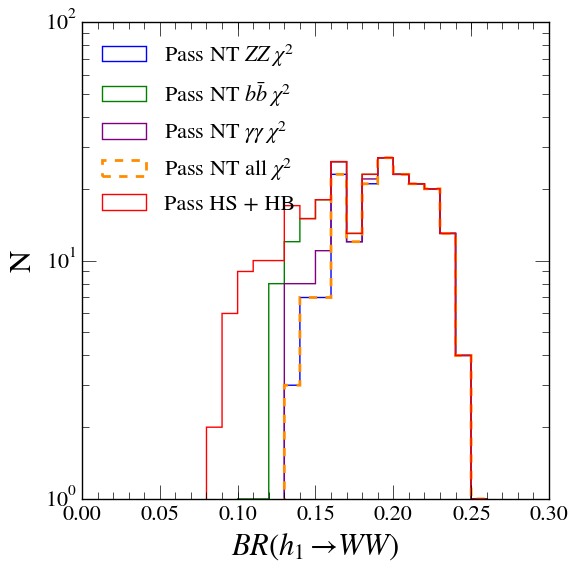

In [55]:
plot_h1ww_NT_HSHB(df_pass_all.query('ma1<10.5'), '', filename='Thesis_plots_2/h1ww_NT_HSHB.pdf')

In [56]:
help(pd.tools.plotting.scatter_matrix)

Help on function scatter_matrix in module pandas.tools.plotting:

scatter_matrix(frame, alpha=0.5, figsize=None, ax=None, grid=False, diagonal='hist', marker='.', density_kwds=None, hist_kwds=None, range_padding=0.05, **kwds)
    Draw a matrix of scatter plots.
    
    Parameters
    ----------
    frame : DataFrame
    alpha : float, optional
        amount of transparency applied
    figsize : (float,float), optional
        a tuple (width, height) in inches
    ax : Matplotlib axis object, optional
    grid : bool, optional
        setting this to True will show the grid
    diagonal : {'hist', 'kde'}
        pick between 'kde' and 'hist' for
        either Kernel Density Estimation or Histogram
        plot in the diagonal
    marker : str, optional
        Matplotlib marker type, default '.'
    hist_kwds : other plotting keyword arguments
        To be passed to hist function
    density_kwds : other plotting keyword arguments
        To be passed to kernel density estimate plot

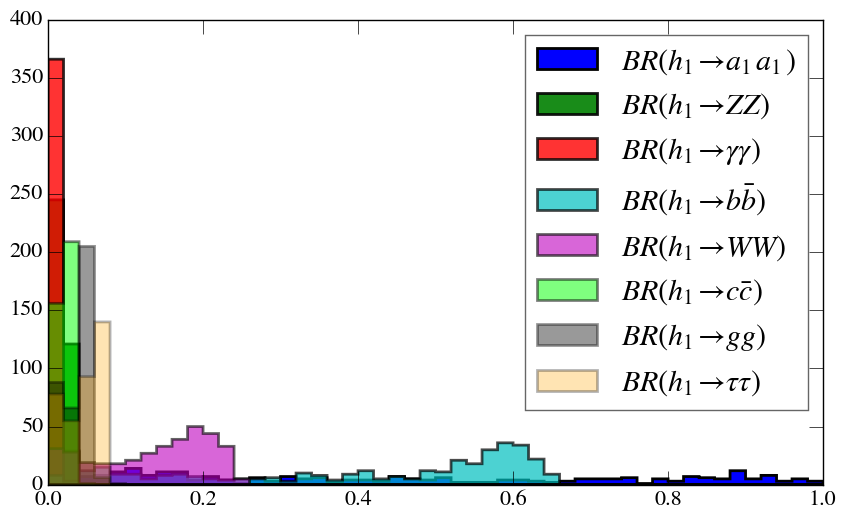

In [57]:
df = df_pass_all
cols = ['Brh1a1a1', 'Brh1zz', 'Brh1gammagamma', 'Brh1bb', 'Brh1ww', 'Brh1cc', 'Brh1gg', 'Brh1tautau']
df = df.query('122.1<mh1<128.1 & mh2>128.1 & ma1<10.5')[cols]
cols_tex = [r'$BR(h_1\to a_1a_1)$', r'$BR(h_1\to ZZ)$', r'$BR(h_1\to \gamma\gamma)$', 
            r'$BR(h_1\to b\bar{b})$', r'$BR(h_1\to WW)$', r'$BR(h_1\to c\bar{c})$', 
            r'$BR(h_1\to gg)$', r'$BR(h_1\to \tau\tau)$']
df.columns = cols_tex
fig, ax = generate_fig_axes(size=[10,6])
colors = ["b","g","r","c","m","lime","k","orange"]
for i, v in enumerate(cols_tex):
    ax.hist(df[v].values, bins=50, range=[0,1], label=v, histtype='stepfilled', 
            color=colors[i], linestyle='solid', linewidth=2, alpha=1-(0.1*i))
plt.legend()
# plt.xscale('log')

In [58]:
@save_fig
def plot_h1BR_corrs(df, title):
    cols = ['Brh1a1a1', 'Brh1zz', 'Brh1gammagamma', 'Brh1bb', 'Brh1ww', 'Brh1cc', 'Brh1gg', 'Brh1tautau']
    df = df.query('122.1<mh1<128.1 & mh2>128.1 & ma1<10.5')[cols]
    cols_tex = [r'$BR(h_1\to a_1a_1)$', r'$BR(h_1\to ZZ)$', r'$BR(h_1\to \gamma\gamma)$', 
                r'$BR(h_1\to b\bar{b})$', r'$BR(h_1\to WW)$', r'$BR(h_1\to c\bar{c})$', 
                r'$BR(h_1\to gg)$', r'$BR(h_1\to \tau\tau)$']
    df.columns = cols_tex
    pd.tools.plotting.scatter_matrix(df, figsize=[22, 22], alpha=0.7, grid=True, hist_kwds={'bins': 25}, color='red')
    plt.suptitle(title, y=0.93)

Setting backend png
Setting backend png


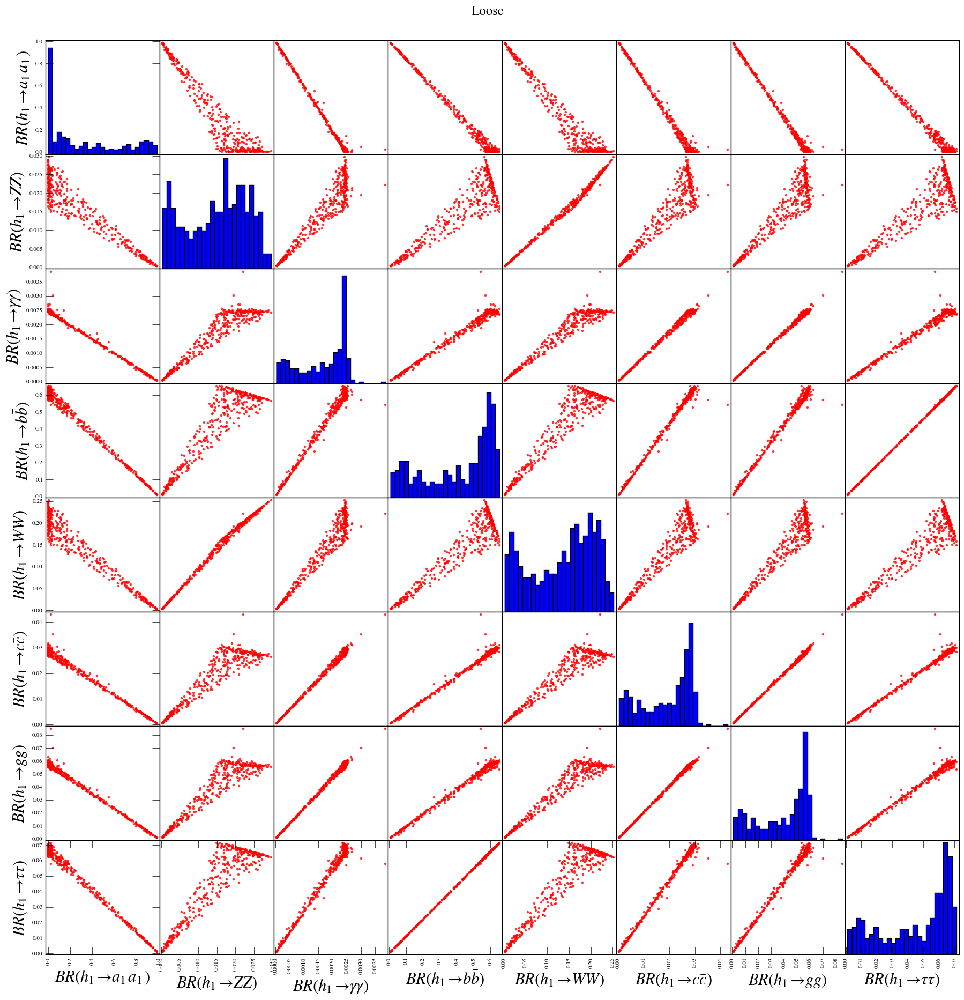

In [59]:
plot_h1BR_corrs(df_pass_all, 'Loose', filename='Thesis_plots_2/h1br_corr_loose.png')

Setting backend png
Setting backend png


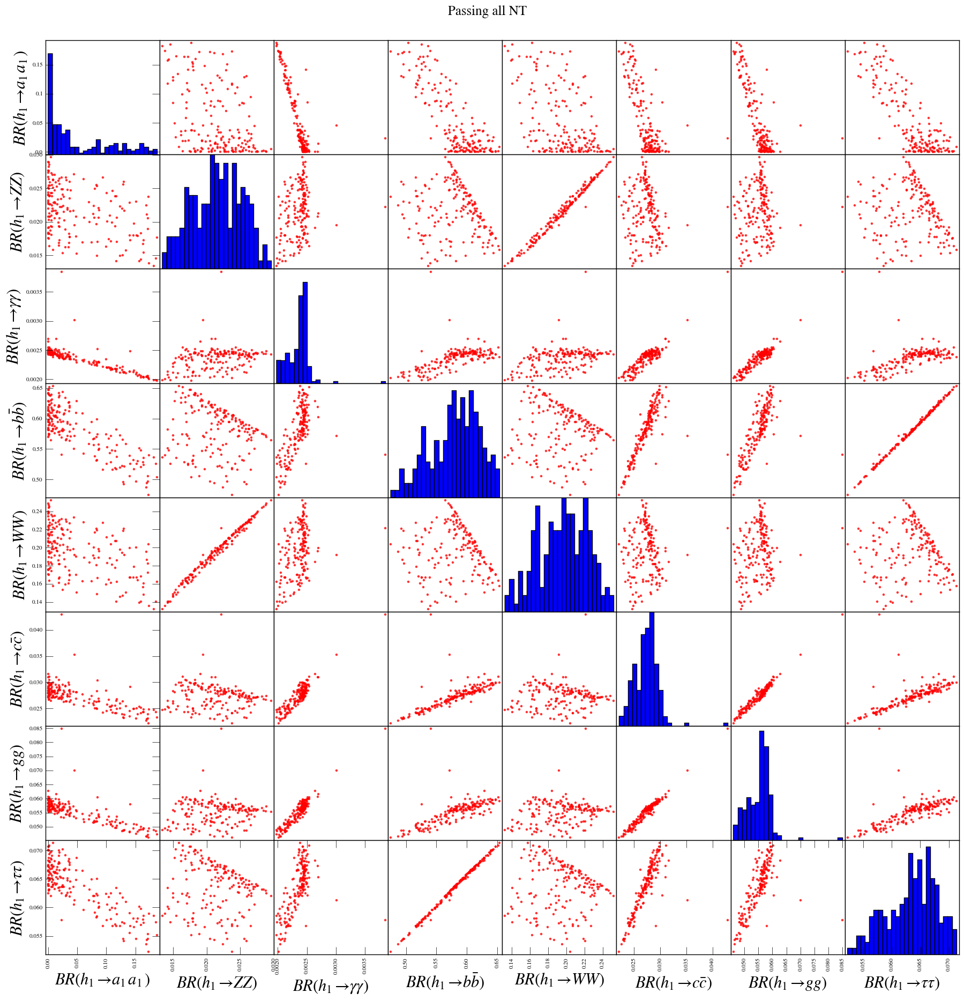

In [60]:
plot_h1BR_corrs(df_pass_all[~df_pass_all.constraints.str.contains('chi2')], 'Passing all NT', filename='Thesis_plots_2/h1br_corr_NT.png')

Setting backend png
Setting backend png


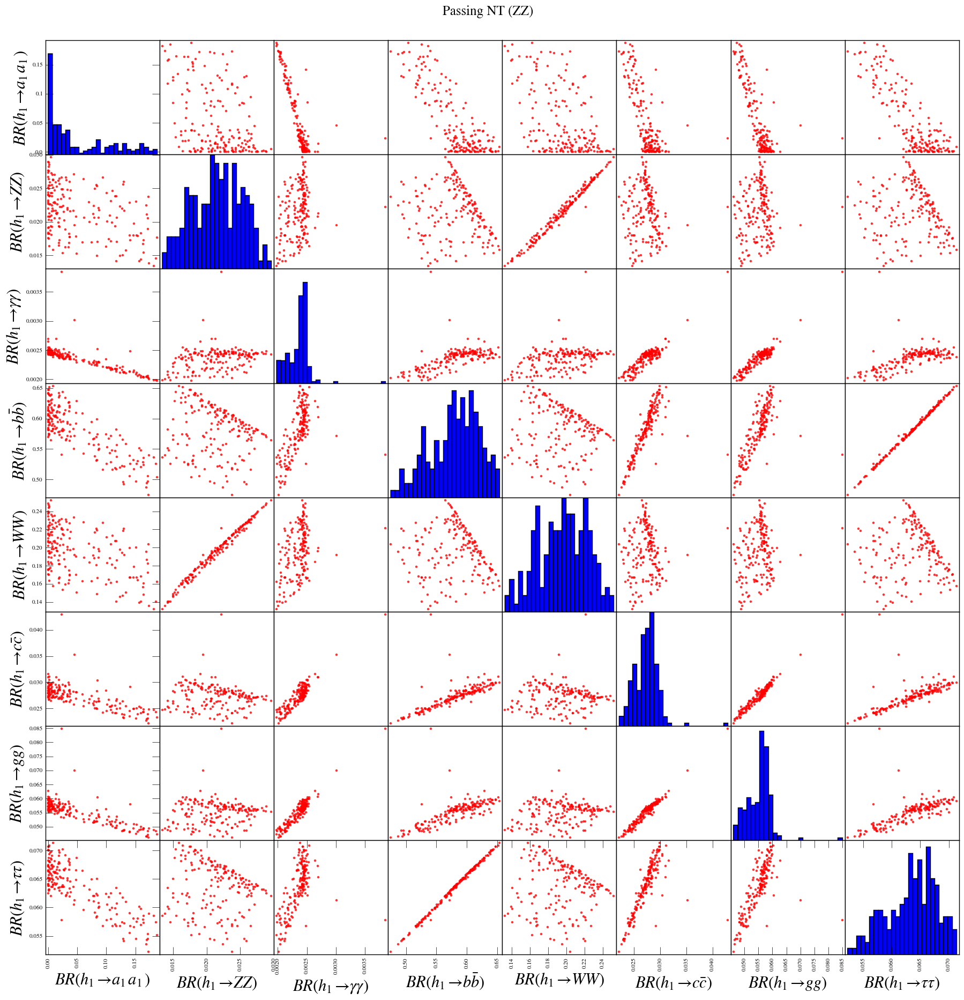

In [61]:
plot_h1BR_corrs(df_pass_all[~df_pass_all.constraints.str.contains('ZZ')], 'Passing NT (ZZ)', filename='Thesis_plots_2/h1br_corr_NT_ZZ.png')

Setting backend png
Setting backend png


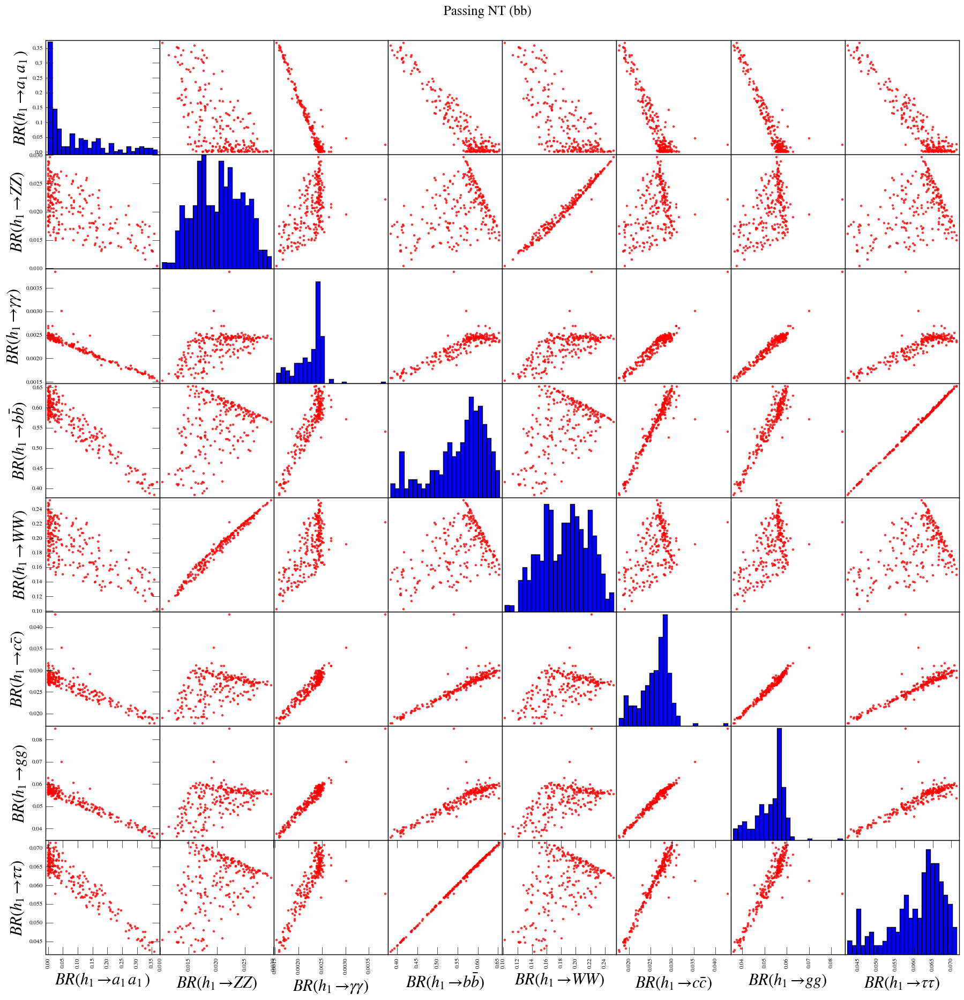

In [62]:
plot_h1BR_corrs(df_pass_all[~df_pass_all.constraints.str.contains('bb')], 'Passing NT (bb)', filename='Thesis_plots_2/h1br_corr_NT_bb.png')

Setting backend png
Setting backend png


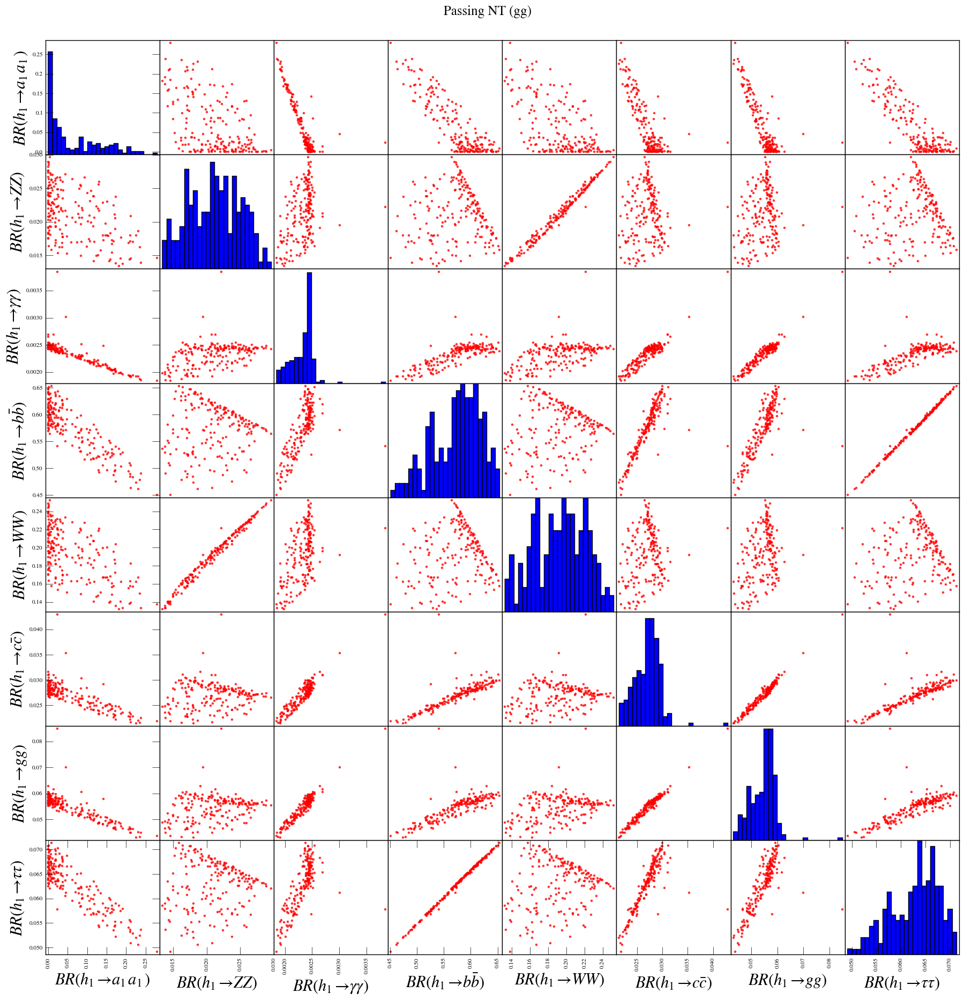

In [63]:
plot_h1BR_corrs(df_pass_all[~df_pass_all.constraints.str.contains('gg')], 'Passing NT (gg)', filename='Thesis_plots_2/h1br_corr_NT_gg.png')

In [64]:
@save_fig
def plot_bra1_ma1(df, title):
    fig, ax = generate_fig_axes()
    plot_scatter(ax = ax, df=df, xvar='ma1', yvar='Bra1tautau', color='green', label=r'$\tau\tau$', s=SIZE)
    plot_scatter(ax=plt.gca(), df=df, xvar='ma1', yvar='Bra1mumu', color='red', label=r'$\mu\mu$', s=SIZE)
    plot_scatter(ax=plt.gca(), df=df, xvar='ma1', yvar='Bra1bb', color='blue', label=r'$b\bar{b}$', s=SIZE)
    plot_scatter(ax=plt.gca(), df=df, xvar='ma1', yvar='Bra1cc', color='orange', label=r'$c\bar{c}$', s=SIZE)
    plot_scatter(ax=plt.gca(), df=df, xvar='ma1', yvar='Bra1ss', color='fuchsia', label=r'$s\bar{s}$', s=SIZE)
    plot_scatter(ax=plt.gca(), df=df, xvar='ma1', yvar='Bra1gg', color='purple', label=r'$gg$', s=SIZE)
    plt.xlim(0, 25)
    plt.ylim(1E-3, 1.2)
    plt.yscale('log')
    plt.legend(loc='lower right', fontsize=16, framealpha=0.85)
    plt.xlabel(r'$m_{a_1}\ \mathrm{[GeV]}$')
    plt.ylabel(r'$BR(a_1 \to XX)$')
    plt.tight_layout()

Setting backend png
Setting backend png


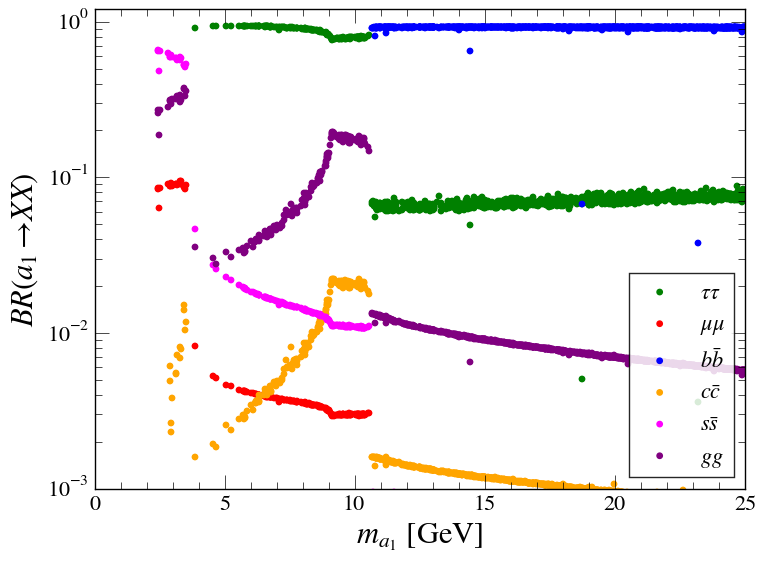

In [65]:
plot_bra1_ma1(df_pass_all[~df_pass_all.constraints.str.contains('chi2')], title, filename='Thesis_plots_2/bra1_ma1.png')

In [66]:
@save_fig
def plot_brh1_mh1(df, title):
    fig, ax = generate_fig_axes()
    plot_scatter(ax = ax, df=df, xvar='mh1', yvar='Brh1tautau', color='green', label=r'$\tau\tau$', s=SIZE)
    plot_scatter(ax=plt.gca(), df=df, xvar='mh1', yvar='Brh1mumu', color='red', label=r'$\mu\mu$', s=SIZE)
    plot_scatter(ax=plt.gca(), df=df, xvar='mh1', yvar='Brh1bb', color='blue', label=r'$b\bar{b}$', s=SIZE)
    plot_scatter(ax=plt.gca(), df=df, xvar='mh1', yvar='Brh1cc', color='orange', label=r'$c\bar{c}$', s=SIZE)
#     plot_scatter(ax=plt.gca(), df=df, xvar='mh1', yvar='Brh1ss', color='fuchsia', label=r'$s\bar{s}$', s=SIZE)
    plot_scatter(ax=plt.gca(), df=df, xvar='mh1', yvar='Brh1gg', color='purple', label=r'$gg$', s=SIZE)
    plt.xlim(0, 25)
    plt.ylim(1E-3, 1.2)
    plt.yscale('log')
    plt.legend(loc='best', fontsize=16, framealpha=0.85)
    plt.xlabel(r'$m_{h_1}\ \mathrm{[GeV]}$')
    plt.ylabel(r'$BR(h_1 \to XX)$')

Setting backend png
Setting backend png


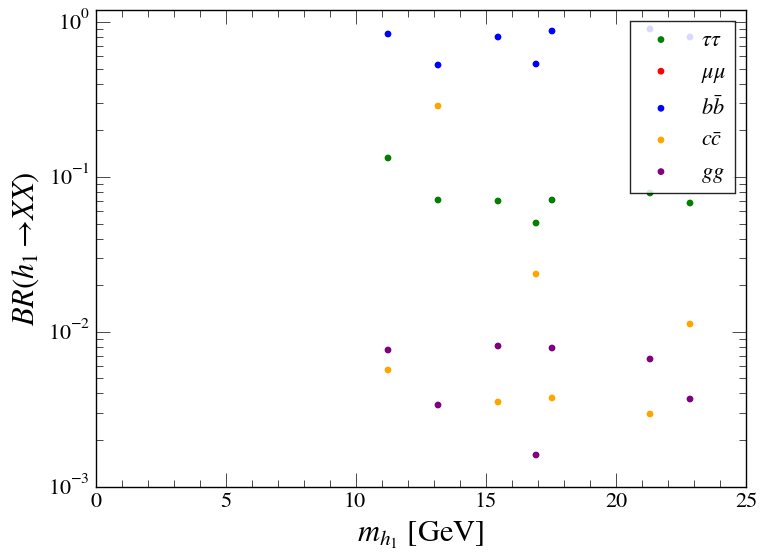

In [67]:
plot_brh1_mh1(df_pass_all, title, filename='Thesis_plots_2/brh1_mh1.png')

(<matplotlib.axes._subplots.AxesSubplot at 0x111fe4a50>,
 <matplotlib.collections.PathCollection at 0x110258710>)

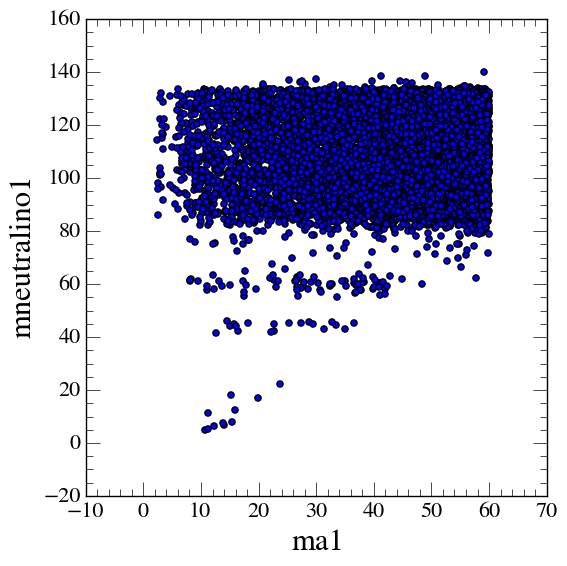

In [68]:
plot_scatter(df=df_pass_all[~df_pass_all.constraints.str.contains('chi2')], xvar='ma1', yvar='mneutralino1')

(<matplotlib.axes._subplots.AxesSubplot at 0x111e9ccd0>,
 <matplotlib.collections.PathCollection at 0x110258890>)

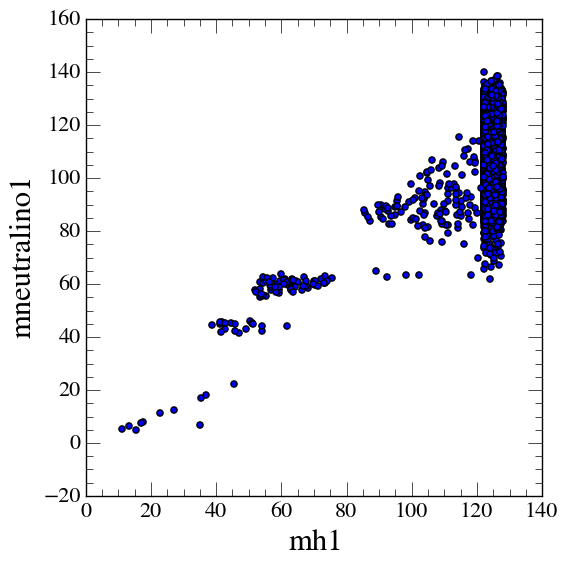

In [69]:
plot_scatter(df=df_pass_all[~df_pass_all.constraints.str.contains('chi2')], xvar='mh1', yvar='mneutralino1')

(<matplotlib.axes._subplots.AxesSubplot at 0x109a1ee90>,
 <matplotlib.collections.PathCollection at 0x10dbc5dd0>)

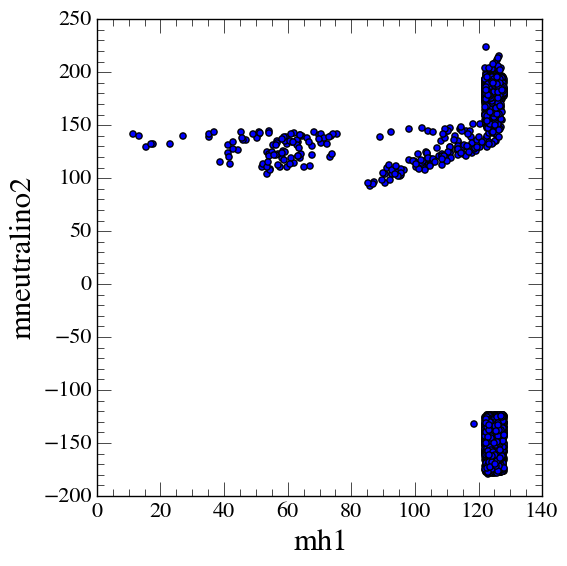

In [70]:
plot_scatter(df=df_pass_all[~df_pass_all.constraints.str.contains('chi2')], xvar='mh1', yvar='mneutralino2')

(<matplotlib.axes._subplots.AxesSubplot at 0x1117bf590>,
 <matplotlib.collections.PathCollection at 0x10dbc5350>)

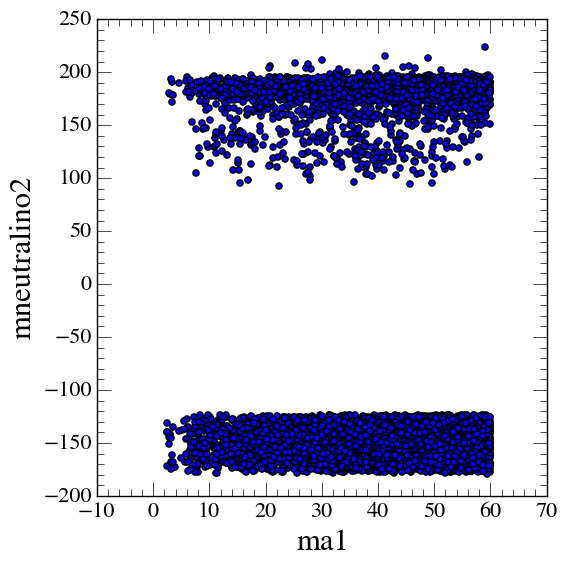

In [71]:
plot_scatter(df=df_pass_all[~df_pass_all.constraints.str.contains('chi2')], xvar='ma1', yvar='mneutralino2')

In [72]:
@save_fig
def plot_mass_corrs(df, title):
    cols = ['mh1', 'mh2', 'mh3', 'mhc', 'ma1', 'ma2', 'mneutralino1', 'mneutralino2', 'mstop1', 'mstop2', 'msbottom1', 'msbottom2', 'mgluino']
    df = df[cols]
    pd.tools.plotting.scatter_matrix(df, figsize=[20, 20], alpha=0.7, grid=True, hist_kwds={'bins': 25}, color='red')
    plt.suptitle(title, y=0.93)

Setting backend png
Setting backend png


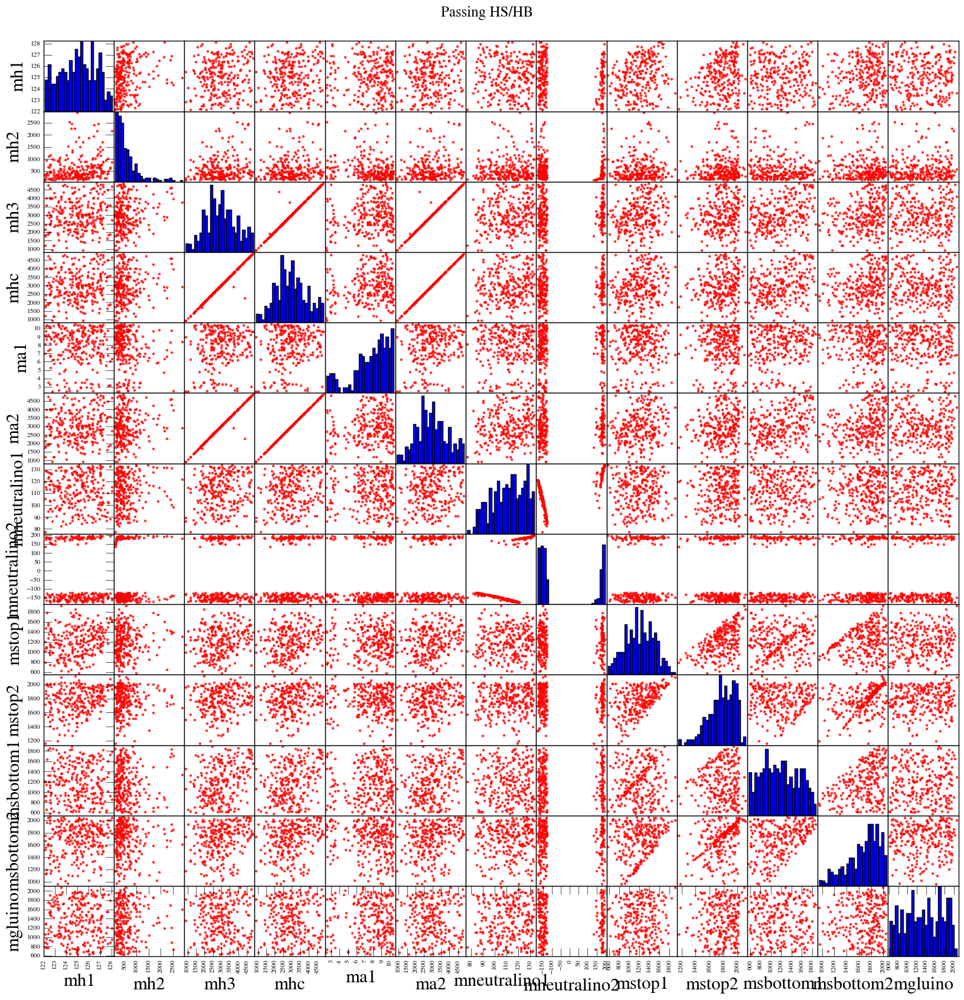

In [73]:
plot_mass_corrs(df_pass_all.query('122.1<mh1<128.1 & mh2>128.1 & ma1<10.5 & HSprob>0.05 & HBresult==1'), 'Passing HS/HB', filename='Thesis_plots_2/mass_corr_HSHB_h1.png')

Setting backend png
Setting backend png


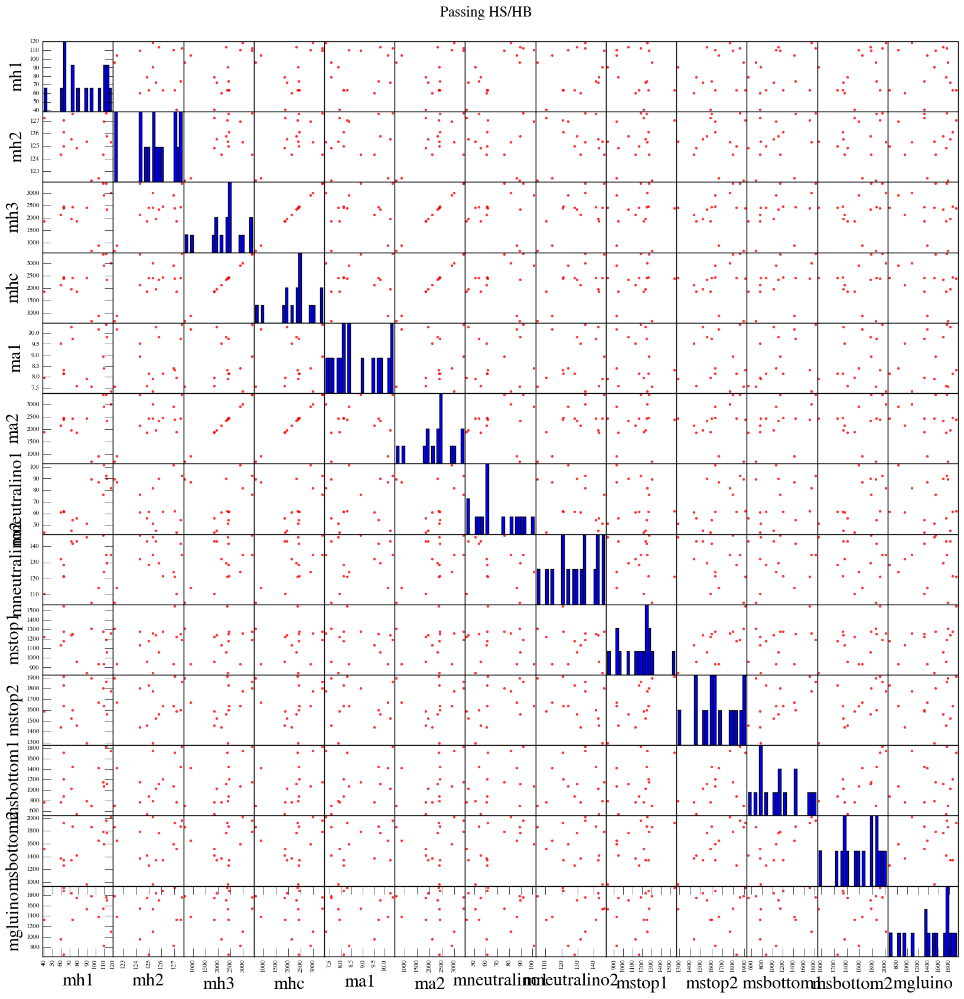

In [74]:
plot_mass_corrs(df_pass_all.query('122.1<mh2<128.1 & mh1<122.1 & ma1<10.5 & HSprob>0.05 & HBresult==1'), 'Passing HS/HB', filename='Thesis_plots_2/mass_corr_HSHB_h2.png')

<matplotlib.colorbar.Colorbar instance at 0x118351f38>

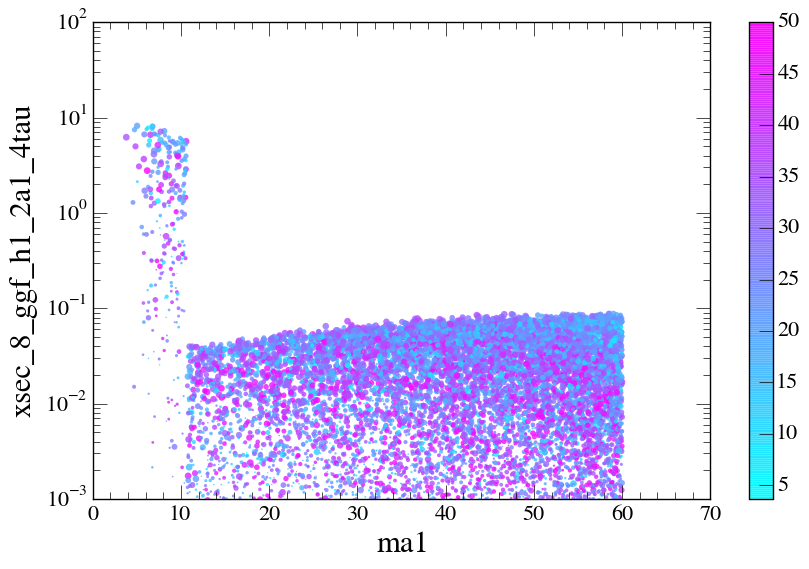

In [75]:
fig, ax = generate_fig_axes(size=[9,6])
_, s = plot_scatter(ax=ax, df=df_pass_all.query('HSprob>0.05 & HBresult==1 & 0.<omega<0.16'),
                    xvar='ma1', yvar='xsec_8_ggf_h1_2a1_4tau', marker='o', 
                    s=40*df_pass_all.query('HSprob>0.05 & HBresult==1 & 0.<omega<0.16')['kappa'].values,
                    c=df_pass_all.query('HSprob>0.05 & HBresult==1 & 0.<omega<0.16')['tgbeta'].values, 
                    cmap=plt.get_cmap('cool'), alpha=0.8, linewidths=0)
plt.ylim(1E-3, 100)
plt.yscale('log')
fig.colorbar(s)
# fig.colorbar(s, label=r'$\tan\beta$')

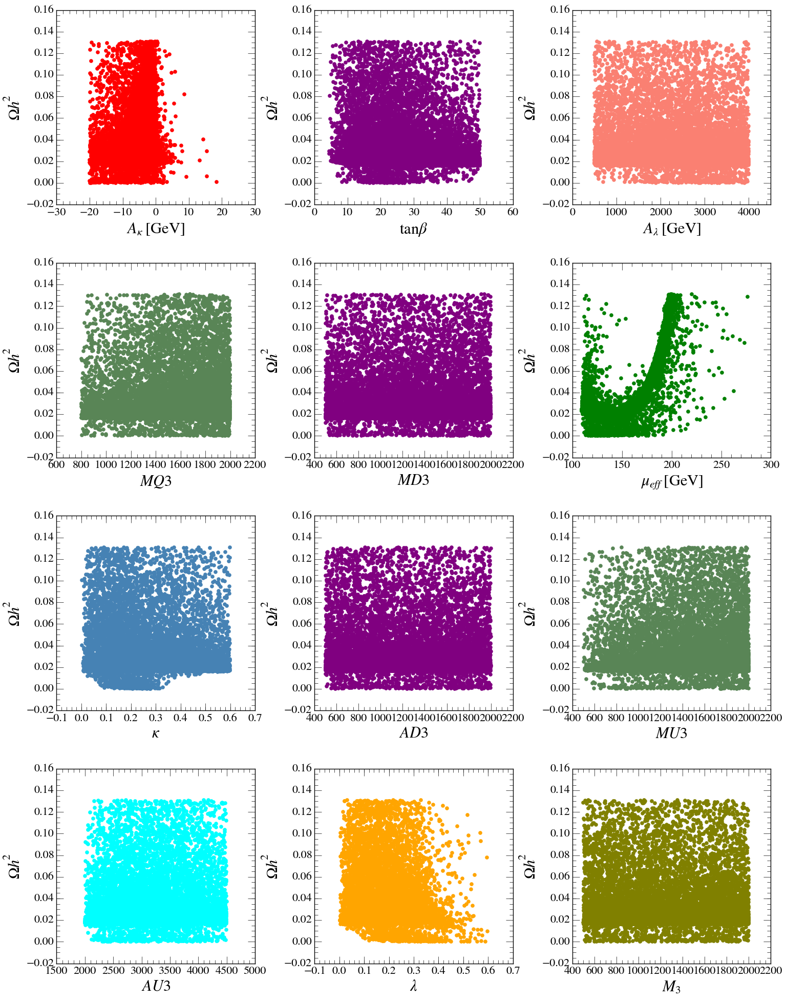

In [76]:
plot_input_params_scatters(df=df_pass_all.query('HSprob>0.05 & HBresult==1 & 122.1<mh1<128.1 & mh2>128.1'),
                           yvar='omega', ylabel=r'$\Omega h^2$', param_dict=nmssm_params_extended)

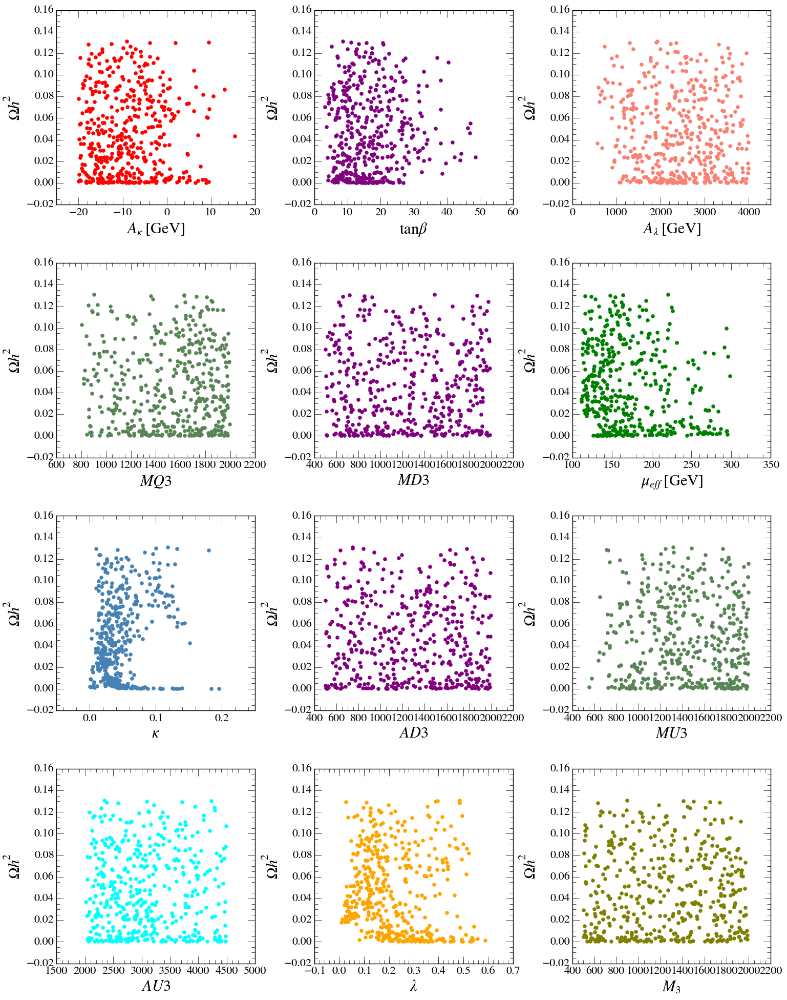

In [77]:
plot_input_params_scatters(df=df_pass_all.query('HSprob>0.05 & HBresult==1 & 122.1<mh2<128.1 & mh1<122.1'),
                           yvar='omega', ylabel=r'$\Omega h^2$', param_dict=nmssm_params_extended)

(<matplotlib.axes._subplots.AxesSubplot at 0x1183aa250>,
 <matplotlib.collections.PathCollection at 0x110e3a6d0>)

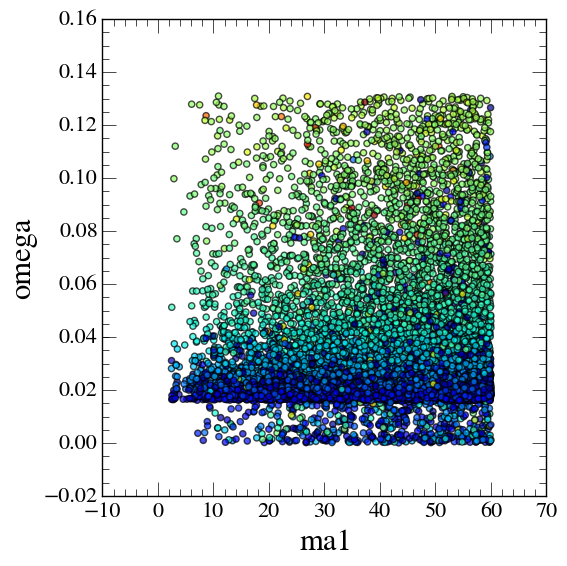

In [78]:
plot_scatter(df=df_pass_all.query('HSprob>0.05 & HBresult==1 & 122.1<mh1<128.1 & mh2>128.1'), 
             yvar='omega', xvar='ma1', alpha=0.7, 
             c=df_pass_all.query('HSprob>0.05 & HBresult==1 & 122.1<mh1<128.1 & mh2>128.1').mueff.values)

(<matplotlib.axes._subplots.AxesSubplot at 0x112647cd0>,
 <matplotlib.collections.PathCollection at 0x119e10850>)

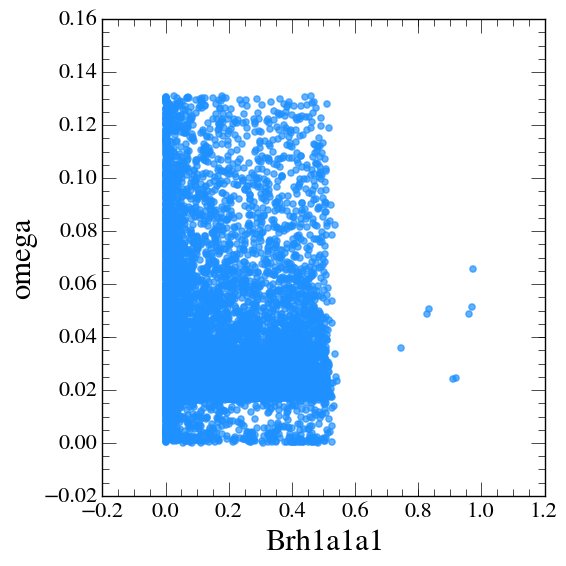

In [79]:
plot_scatter(df=df_pass_all.query('HSprob>0.05 & HBresult==1 & 122.1<mh1<128.1 & mh2>128.1'), 
             yvar='omega', xvar='Brh1a1a1', alpha=0.7, color='dodgerblue')

(<matplotlib.axes._subplots.AxesSubplot at 0x111012350>,
 <matplotlib.collections.PathCollection at 0x110531b90>)

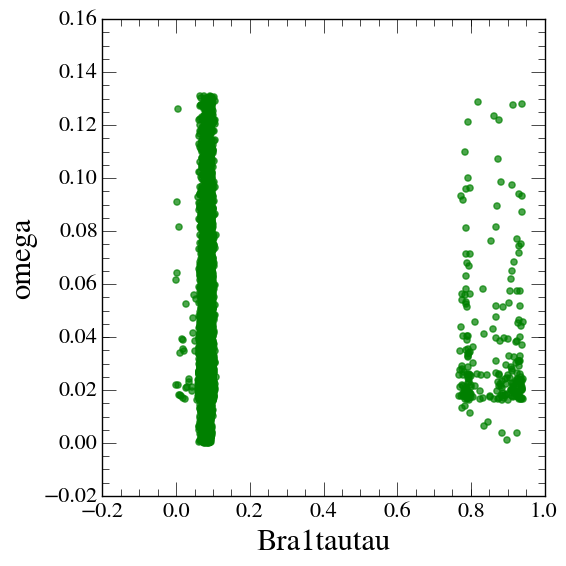

In [80]:
plot_scatter(df=df_pass_all.query('HSprob>0.05 & HBresult==1 & 122.1<mh1<128.1 & mh2>128.1'), 
             yvar='omega', xvar='Bra1tautau', alpha=0.7, color='green')

(<matplotlib.axes._subplots.AxesSubplot at 0x11b030610>,
 <matplotlib.collections.PathCollection at 0x10ffae210>)

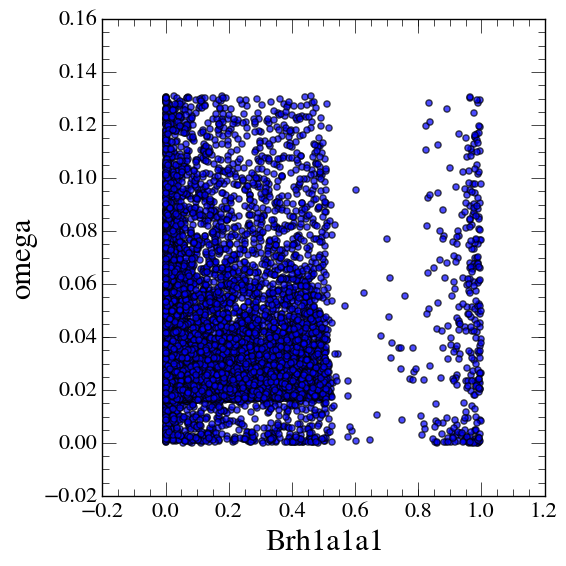

In [81]:
plot_scatter(df=df_pass_all.query('HSprob>0.05 & HBresult==1'), yvar='omega', xvar='Brh1a1a1', alpha=0.7)

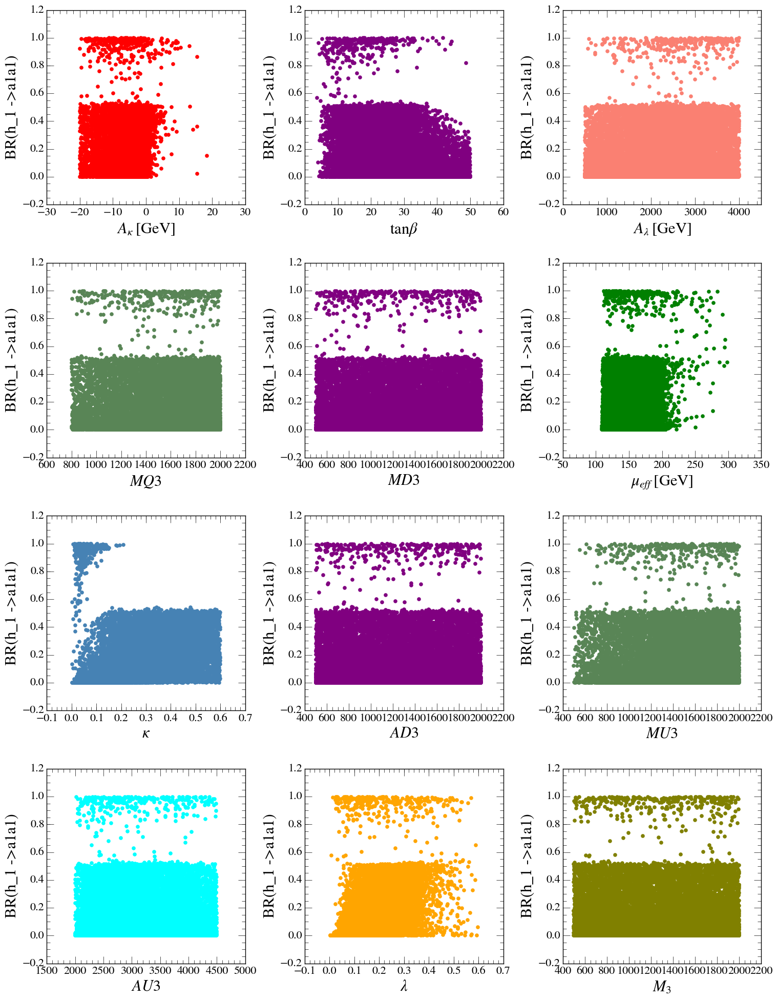

In [82]:
plot_input_params_scatters(df=df_pass_all.query('HSprob>0.05 & HBresult==1'),
                           yvar='Brh1a1a1', ylabel='BR(h_1 ->a1a1)', param_dict=nmssm_params_extended)

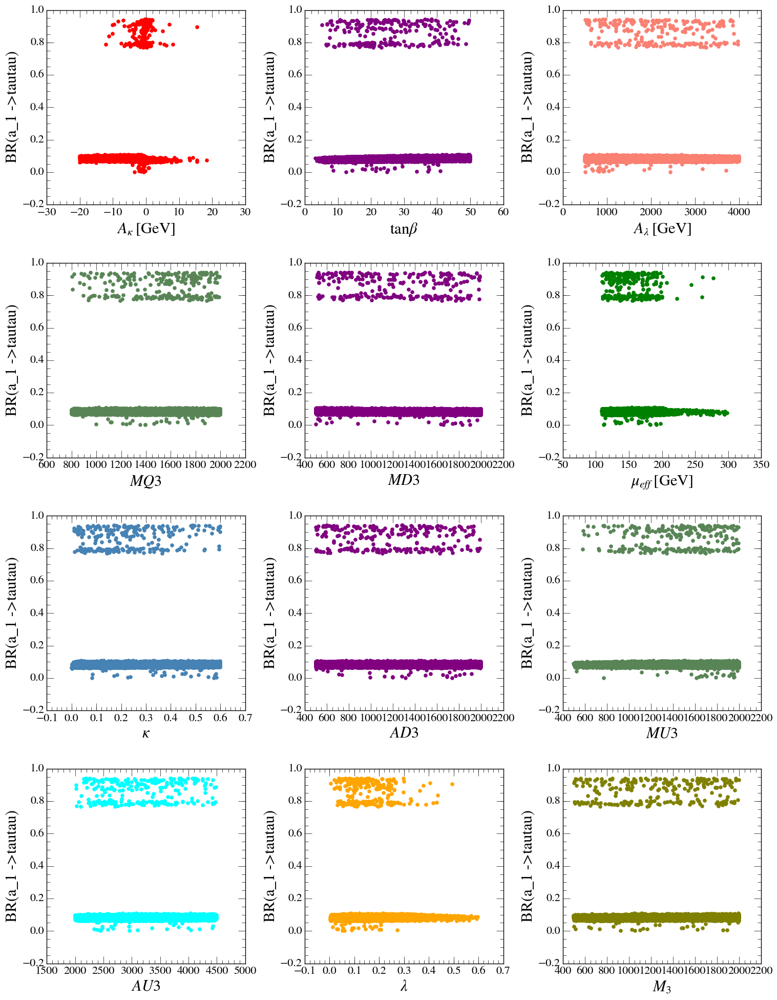

In [83]:
plot_input_params_scatters(df=df_pass_all.query('HSprob>0.05 & HBresult==1'),
                           yvar='Bra1tautau', ylabel='BR(a_1 ->tautau)', param_dict=nmssm_params_extended)

In [84]:
azz=43.29
bzz=4.91
czz=9.61
mugcenzz=1.07
muvcenzz=1.23

def chi2zz(ggf_vv, vh_vv):
    return azz*(ggf_vv-mugcenzz)**2+czz*(vh_vv-muvcenzz)**2+2*bzz*(ggf_vv-mugcenzz)*(vh_vv-muvcenzz)

In [85]:
ggf_vv = np.arange(0, 1.9, 0.01)
vh_vv = np.arange(0, 1.9, 0.01)

chi2 = np.empty([len(ggf_vv), len(vh_vv)])
for i, x in enumerate(ggf_vv):
    for j, y in enumerate(vh_vv):
        chi2[i,j] = chi2zz(x, y)

1.07 1.23


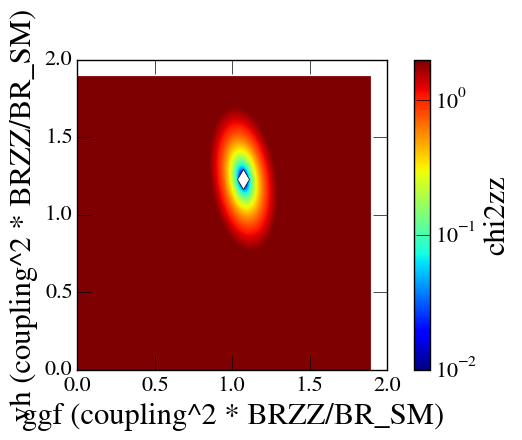

In [87]:
plt.imshow(chi2.T, interpolation=None, origin='lower', 
#            cmap=plt.get_cmap('summer'), 
           norm=mpl.colors.LogNorm(vmin=0.01, vmax=100),
           extent=[ggf_vv.min(), ggf_vv.max(), vh_vv.min(), vh_vv.max()],
           vmin=0.01, vmax=2)
plt.colorbar(label='chi2zz')

plt.xlabel('ggf (coupling^2 * BRZZ/BR_SM)')
plt.ylabel('vh (coupling^2 * BRZZ/BR_SM)')
min_x_ind, min_y_ind = np.unravel_index(chi2.argmin(), chi2.shape)
print ggf_vv[min_x_ind], vh_vv[min_y_ind]
plt.plot(ggf_vv[min_x_ind], vh_vv[min_y_ind], 'd', c='white', markersize=10)
# print plt.xticks
# plt.gca().set_xticks(ggf_vv)

(0.2519, 0.2522)

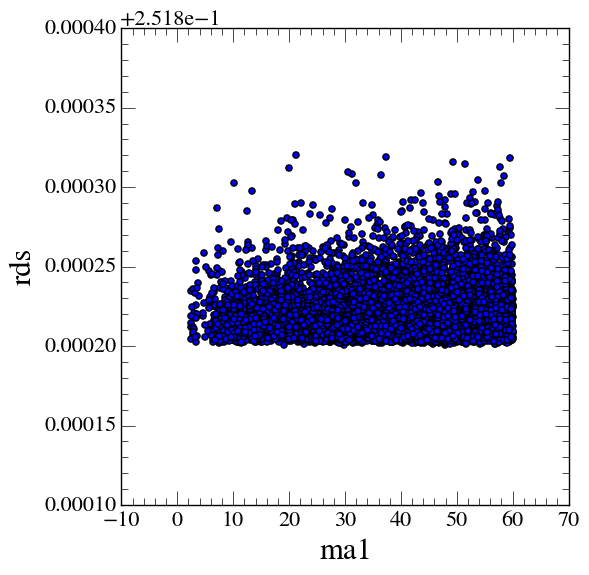

In [98]:
plot_scatter(df=df_pass_all.query('HSprob>0.05 & HBresult==1'), xvar='ma1', yvar='rds')
plt.ylim(0.2519, 0.2522)

(0, 10)

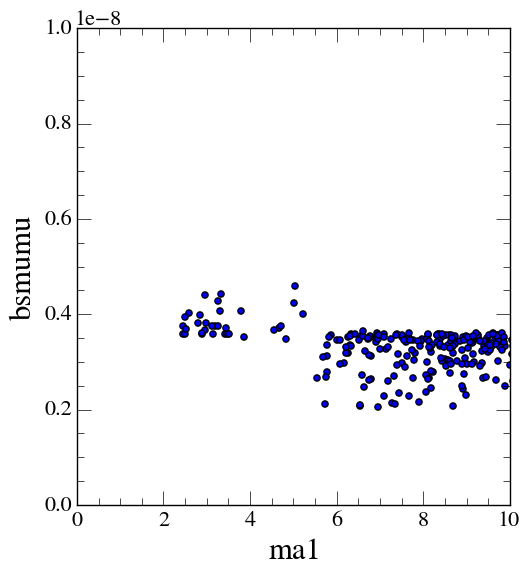

In [105]:
plot_scatter(df=df_pass_all.query('HSprob>0.05 & HBresult==1'), xvar='ma1', yvar='bsmumu')
plt.ylim(0, 0.00000001)
plt.xlim(0, 10)

(0.2515, 0.2525)

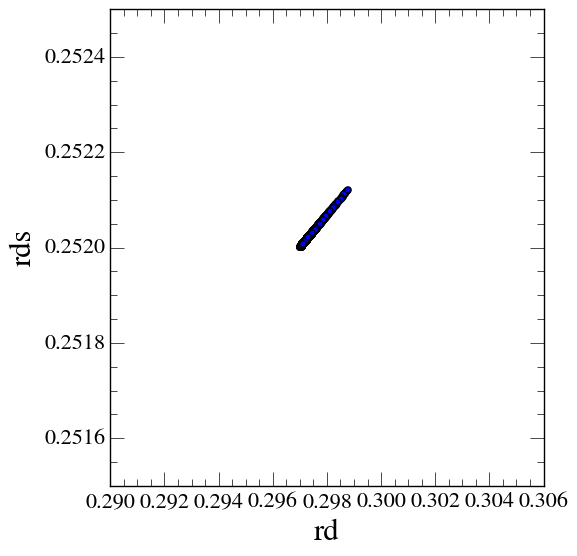

In [96]:
plot_scatter(df=df_pass_all.query('HSprob>0.05 & HBresult==1'), xvar='rd', yvar='rds')
plt.ylim(0.2515, 0.2525)